# แล็บ: Convolutional Neural Networks (CNN) ด้วย PyTorch

**วัตถุประสงค์การเรียนรู้:**
- เข้าใจรูปแบบ Tensor สำหรับรูปภาพ (N, C, H, W)
- เข้าใจพารามิเตอร์ของ Conv2d และการคำนวณขนาด output
- สร้าง CNN architecture พร้อม pooling, normalization, และ activation
- ใช้งาน convolution แบบต่างๆ
- ฝึกและ debug โมเดล CNN
- **[NEW] โหลดและใช้งาน Pretrained Models**
- **[NEW] ดึง Feature Maps จาก Pretrained Models**

**รูปที่ใช้ในการสอน:** Taj Mahal 🕌

## ส่วนที่ 1: ติดตั้งและ Import Libraries

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torchvision import models  # สำหรับ pretrained models
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import numpy as np
import os
from PIL import Image
from pathlib import Path

# ============================================================
# ตั้งค่า Thai Font สำหรับ Matplotlib
# ============================================================
def setup_thai_font():
    """
    ตั้งค่า Thai font สำหรับ matplotlib
    ลองหา font ภาษาไทยที่มีในระบบ
    """
    # รายชื่อ Thai fonts ที่นิยม
    thai_fonts = [
        'TH Sarabun New',
        'Tahoma',
        'Angsana New', 
        'Browallia New',
        'Cordia New',
        'Garuda',
        'Loma',
        'Norasi',
        'Sawasdee',
        'TlwgTypo',
        'Noto Sans Thai',
        'Noto Serif Thai',
    ]
    
    # หา fonts ที่มีในระบบ
    available_fonts = [f.name for f in fm.fontManager.ttflist]
    
    # ลองหา Thai font ที่มี
    for font in thai_fonts:
        if font in available_fonts:
            plt.rcParams['font.family'] = font
            print(f"✅ ใช้ Thai font: {font}")
            return font
    
    # ถ้าไม่เจอ Thai font ให้ใช้ DejaVu Sans (รองรับบางภาษา)
    print("⚠️ ไม่พบ Thai font ในระบบ")
    print("💡 แนะนำติดตั้ง: sudo apt install fonts-thai-tlwg fonts-noto-cjk")
    print("   หรือใช้ title ภาษาอังกฤษในกราฟ")
    return None

# ลองตั้งค่า Thai font
THAI_FONT = setup_thai_font()

# ถ้าไม่มี Thai font ให้ใช้ภาษาอังกฤษใน plots
USE_ENGLISH = THAI_FONT is None

# ============================================================
# ตรวจสอบ device (GPU หรือ CPU)
# ============================================================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🖥️  Device: {device}")
print(f"📦 PyTorch version: {torch.__version__}")

# สร้างโฟลเดอร์สำหรับเก็บผลลัพธ์
os.makedirs('outputs', exist_ok=True)
os.makedirs('images', exist_ok=True)

⚠️ ไม่พบ Thai font ในระบบ
💡 แนะนำติดตั้ง: sudo apt install fonts-thai-tlwg fonts-noto-cjk
   หรือใช้ title ภาษาอังกฤษในกราฟ
🖥️  Device: cuda
📦 PyTorch version: 2.9.1+cu128


## ส่วนที่ 2: โหลดรูปภาพสำหรับการเรียนรู้

🖼️ Load Taj Mahal Image
✅ Found image at ./Taj_Mahal.jpg

📷 Image Info:
   Format: JPEG
   Mode: RGB
   Size: (796, 712) (Width x Height)


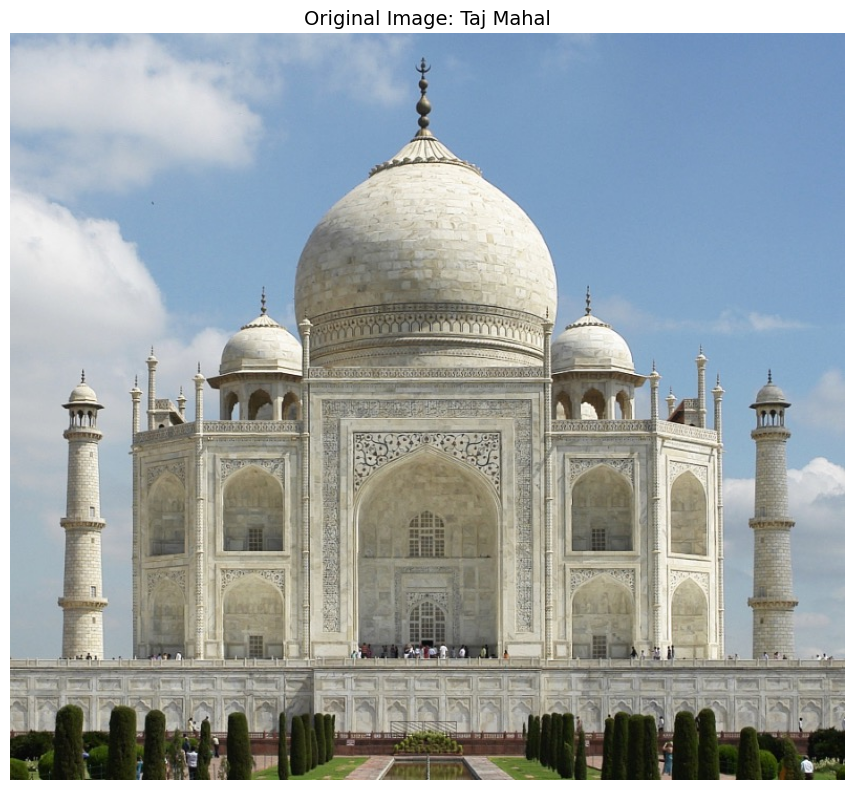

💾 Saved: outputs/01_original_image.png


In [2]:
print("=" * 60)
print("🖼️ Load Taj Mahal Image" if USE_ENGLISH else "🖼️ โหลดรูปภาพ Taj Mahal")
print("=" * 60)

# โหลดรูป Taj Mahal
IMG_PATH = './Taj_Mahal.jpg'

# ตรวจสอบว่ามีรูปหรือไม่
if os.path.exists(IMG_PATH):
    print(f"✅ Found image at {IMG_PATH}" if USE_ENGLISH else f"✅ พบรูปภาพที่ {IMG_PATH}")
else:
    print(f"⚠️ Image not found at {IMG_PATH}" if USE_ENGLISH else f"⚠️ ไม่พบรูปภาพที่ {IMG_PATH}")
    print("Please copy Taj_Mahal.jpg to images/ folder" if USE_ENGLISH else "กรุณาคัดลอกรูป Taj_Mahal.jpg ไปที่โฟลเดอร์ images/")

# โหลดรูปด้วย PIL
original_image = Image.open(IMG_PATH)
print(f"\n📷 Image Info:" if USE_ENGLISH else "\n📷 ข้อมูลรูปภาพ:")
print(f"   Format: {original_image.format}")
print(f"   Mode: {original_image.mode}")
print(f"   Size: {original_image.size} (Width x Height)")

# แสดงรูปต้นฉบับ
plt.figure(figsize=(10, 8))
plt.imshow(original_image)
plt.title('Original Image: Taj Mahal', fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.savefig('outputs/01_original_image.png', dpi=100, bbox_inches='tight')
plt.show()
print("💾 Saved: outputs/01_original_image.png")

## ส่วนที่ 3: แปลงรูปภาพเป็น Tensor (N, C, H, W)

PyTorch ใช้รูปแบบ **NCHW** สำหรับ tensor ของรูปภาพ:

| ตัวย่อ | ความหมาย | ตัวอย่าง |
|--------|----------|----------|
| **N** | Batch size (จำนวนรูป) | 1 รูป |
| **C** | Channels (ช่องสี) | RGB = 3 |
| **H** | Height (ความสูง) | 224 pixels |
| **W** | Width (ความกว้าง) | 224 pixels |

In [3]:
print("=" * 60)
print("📐 Convert Image to Tensor (N, C, H, W)")
print("=" * 60)

# สร้าง transform เพื่อแปลงรูปเป็น tensor
transform_to_tensor = transforms.Compose([
    transforms.Resize((256, 256)),  # ปรับขนาด
    transforms.ToTensor(),           # แปลงเป็น tensor (0-1)
])

# แปลงรูปเป็น tensor
image_tensor = transform_to_tensor(original_image)
print(f"\n📊 After converting to Tensor:")
print(f"   Shape: {image_tensor.shape}")
print(f"   -> (C, H, W) = (Channels, Height, Width)")
print(f"   -> ({image_tensor.shape[0]}, {image_tensor.shape[1]}, {image_tensor.shape[2]})")

# เพิ่ม Batch dimension
image_batch = image_tensor.unsqueeze(0)  # เพิ่ม N dimension
print(f"\n📊 After adding Batch dimension:")
print(f"   Shape: {image_batch.shape}")
print(f"   -> (N, C, H, W) = (Batch, Channels, Height, Width)")
print(f"   -> ({image_batch.shape[0]}, {image_batch.shape[1]}, {image_batch.shape[2]}, {image_batch.shape[3]})")

print(f"\n📈 Tensor value range:")
print(f"   Min: {image_tensor.min():.4f}")
print(f"   Max: {image_tensor.max():.4f}")
print(f"   -> ToTensor() converts 0-255 to 0-1")

📐 Convert Image to Tensor (N, C, H, W)

📊 After converting to Tensor:
   Shape: torch.Size([3, 256, 256])
   -> (C, H, W) = (Channels, Height, Width)
   -> (3, 256, 256)

📊 After adding Batch dimension:
   Shape: torch.Size([1, 3, 256, 256])
   -> (N, C, H, W) = (Batch, Channels, Height, Width)
   -> (1, 3, 256, 256)

📈 Tensor value range:
   Min: 0.0157
   Max: 0.9843
   -> ToTensor() converts 0-255 to 0-1


In [4]:
# ตัวอย่างการเข้าถึง tensor ในแต่ละมิติ
print("\n" + "=" * 60)
print("🔍 Accessing Tensor Dimensions")
print("=" * 60)

# ตัวอย่างที่ 1: เข้าถึงรูปแรกจาก batch
first_image = image_batch[0]  # Shape: (C, H, W) = (3, 256, 256)
print(f"\n📌 Example 1: Access first image from batch")
print(f"   image_batch[0].shape = {first_image.shape}")
print(f"   -> Single image with shape (3, 256, 256)")

# ตัวอย่างที่ 2: เข้าถึง channel แต่ละสี
red_channel = image_batch[0, 0]    # Red channel
green_channel = image_batch[0, 1]  # Green channel
blue_channel = image_batch[0, 2]   # Blue channel

print(f"\n📌 Example 2: Access RGB channels")
print(f"   Red channel:   image_batch[0, 0].shape = {red_channel.shape}")
print(f"   Green channel: image_batch[0, 1].shape = {green_channel.shape}")
print(f"   Blue channel:  image_batch[0, 2].shape = {blue_channel.shape}")

# ตัวอย่างที่ 3: เข้าถึง pixel เดียว
pixel_rgb = image_batch[0, :, 128, 128]
print(f"\n📌 Example 3: RGB values at position (128, 128)")
print(f"   image_batch[0, :, 128, 128] = {pixel_rgb}")
print(f"   -> R={pixel_rgb[0]:.3f}, G={pixel_rgb[1]:.3f}, B={pixel_rgb[2]:.3f}")


🔍 Accessing Tensor Dimensions

📌 Example 1: Access first image from batch
   image_batch[0].shape = torch.Size([3, 256, 256])
   -> Single image with shape (3, 256, 256)

📌 Example 2: Access RGB channels
   Red channel:   image_batch[0, 0].shape = torch.Size([256, 256])
   Green channel: image_batch[0, 1].shape = torch.Size([256, 256])
   Blue channel:  image_batch[0, 2].shape = torch.Size([256, 256])

📌 Example 3: RGB values at position (128, 128)
   image_batch[0, :, 128, 128] = tensor([0.5961, 0.6000, 0.5608])
   -> R=0.596, G=0.600, B=0.561



🎨 Visualizing RGB Channels


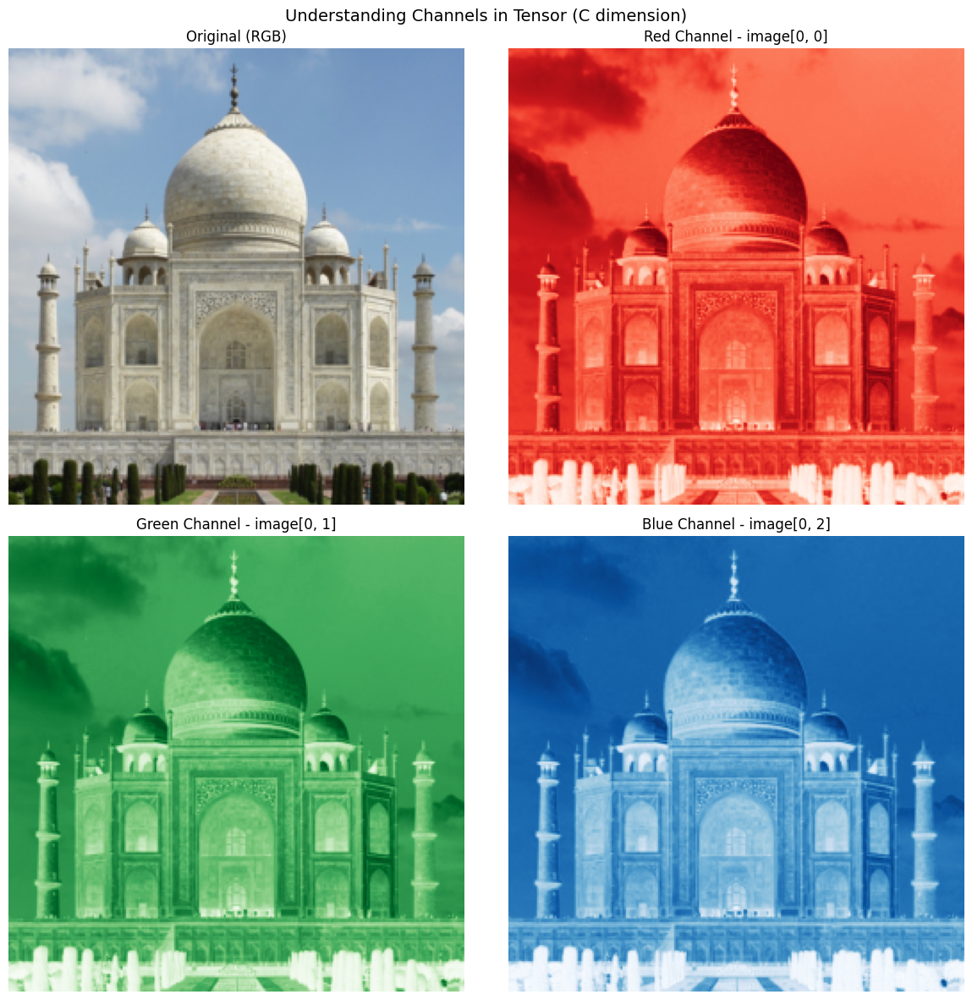

💾 Saved: outputs/02_rgb_channels.png


In [5]:
# Visualize RGB channels
print("\n" + "=" * 60)
print("🎨 Visualizing RGB Channels")
print("=" * 60)

fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# Original
axes[0, 0].imshow(image_tensor.permute(1, 2, 0).numpy())
axes[0, 0].set_title('Original (RGB)', fontsize=12)
axes[0, 0].axis('off')

# Red channel
axes[0, 1].imshow(red_channel.numpy(), cmap='Reds')
axes[0, 1].set_title('Red Channel - image[0, 0]', fontsize=12)
axes[0, 1].axis('off')

# Green channel
axes[1, 0].imshow(green_channel.numpy(), cmap='Greens')
axes[1, 0].set_title('Green Channel - image[0, 1]', fontsize=12)
axes[1, 0].axis('off')

# Blue channel
axes[1, 1].imshow(blue_channel.numpy(), cmap='Blues')
axes[1, 1].set_title('Blue Channel - image[0, 2]', fontsize=12)
axes[1, 1].axis('off')

plt.suptitle('Understanding Channels in Tensor (C dimension)', fontsize=14)
plt.tight_layout()
plt.savefig('outputs/02_rgb_channels.png', dpi=100, bbox_inches='tight')
plt.show()
print("💾 Saved: outputs/02_rgb_channels.png")

## ส่วนที่ 4: Filter/Kernel และ Convolution

**Filter** หรือ **Kernel** คือหน้าต่างเล็กๆ (เช่น 3×3) ที่เลื่อนไปบนรูปภาพ
เพื่อดึง features ออกมา

In [6]:
print("=" * 60)
print("🔲 Understanding Filter/Kernel")
print("=" * 60)

print("""
Filter/Kernel is a small matrix (e.g., 3x3, 5x5, 7x7)
that slides over the image to extract features.

Common Filters:

1. Edge Detection (Sobel X - Vertical Edges):
   [-1  0  1]
   [-2  0  2]
   [-1  0  1]

2. Edge Detection (Sobel Y - Horizontal Edges):
   [-1 -2 -1]
   [ 0  0  0]
   [ 1  2  1]

3. Sharpen:
   [ 0 -1  0]
   [-1  5 -1]
   [ 0 -1  0]

4. Blur (Box Filter 3x3):
   [1/9 1/9 1/9]
   [1/9 1/9 1/9]
   [1/9 1/9 1/9]
""")

🔲 Understanding Filter/Kernel

Filter/Kernel is a small matrix (e.g., 3x3, 5x5, 7x7)
that slides over the image to extract features.

Common Filters:

1. Edge Detection (Sobel X - Vertical Edges):
   [-1  0  1]
   [-2  0  2]
   [-1  0  1]

2. Edge Detection (Sobel Y - Horizontal Edges):
   [-1 -2 -1]
   [ 0  0  0]
   [ 1  2  1]

3. Sharpen:
   [ 0 -1  0]
   [-1  5 -1]
   [ 0 -1  0]

4. Blur (Box Filter 3x3):
   [1/9 1/9 1/9]
   [1/9 1/9 1/9]
   [1/9 1/9 1/9]



In [7]:
# แปลงรูปเป็น grayscale สำหรับทดลอง convolution
print("\n" + "=" * 60)
print("🧮 Convolution Demo with Taj Mahal")
print("=" * 60)

# แปลงเป็น grayscale
grayscale_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
])

gray_tensor = grayscale_transform(original_image)
gray_batch = gray_tensor.unsqueeze(0)  # (1, 1, 256, 256)

print(f"Grayscale tensor shape: {gray_batch.shape}")
print(f"-> (N=1, C=1, H=256, W=256)")


🧮 Convolution Demo with Taj Mahal
Grayscale tensor shape: torch.Size([1, 1, 256, 256])
-> (N=1, C=1, H=256, W=256)


In [8]:
# สร้าง kernels ต่างๆ
print("\n📝 Creating Kernels for Demo")

# Sobel X (ตรวจจับขอบแนวตั้ง)
sobel_x = torch.tensor([
    [-1., 0., 1.],
    [-2., 0., 2.],
    [-1., 0., 1.]
]).view(1, 1, 3, 3)

# Sobel Y (ตรวจจับขอบแนวนอน)
sobel_y = torch.tensor([
    [-1., -2., -1.],
    [ 0.,  0.,  0.],
    [ 1.,  2.,  1.]
]).view(1, 1, 3, 3)

# Sharpen (เพิ่มความคม)
sharpen = torch.tensor([
    [ 0., -1.,  0.],
    [-1.,  5., -1.],
    [ 0., -1.,  0.]
]).view(1, 1, 3, 3)

# Blur (เบลอ)
blur = torch.ones(1, 1, 5, 5) / 25

# Edge detection (Laplacian)
laplacian = torch.tensor([
    [ 0., -1.,  0.],
    [-1.,  4., -1.],
    [ 0., -1.,  0.]
]).view(1, 1, 3, 3)

# Emboss
emboss = torch.tensor([
    [-2., -1.,  0.],
    [-1.,  1.,  1.],
    [ 0.,  1.,  2.]
]).view(1, 1, 3, 3)

print("✅ Created kernels: Sobel X, Sobel Y, Sharpen, Blur, Laplacian, Emboss")


📝 Creating Kernels for Demo
✅ Created kernels: Sobel X, Sobel Y, Sharpen, Blur, Laplacian, Emboss



🔄 Applying Convolution with Each Kernel


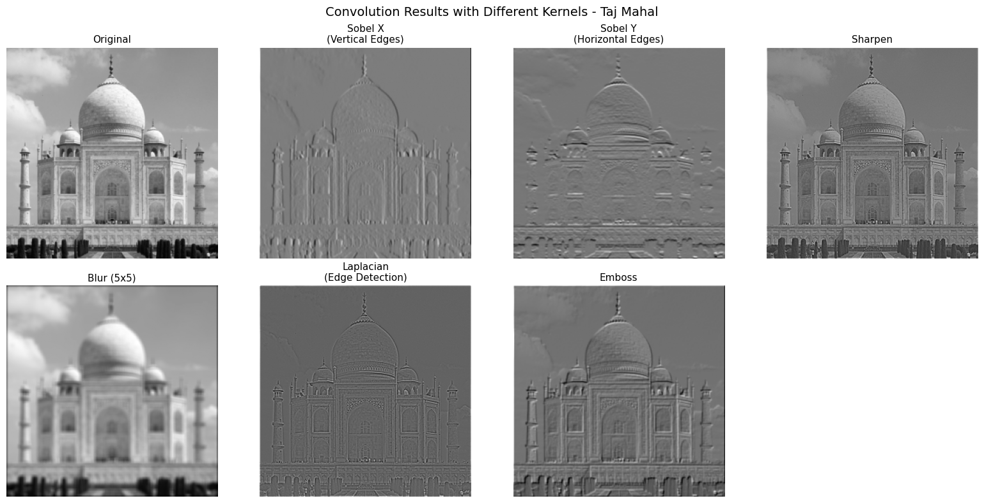

💾 Saved: outputs/03_convolution_kernels.png


In [9]:
# Apply convolutions
print("\n🔄 Applying Convolution with Each Kernel")

kernels = {
    'Original': None,
    'Sobel X\n(Vertical Edges)': sobel_x,
    'Sobel Y\n(Horizontal Edges)': sobel_y,
    'Sharpen': sharpen,
    'Blur (5x5)': blur,
    'Laplacian\n(Edge Detection)': laplacian,
    'Emboss': emboss,
}

# สร้าง figure
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for idx, (name, kernel) in enumerate(kernels.items()):
    if kernel is None:
        # Original
        output = gray_batch[0, 0]
    else:
        # Apply convolution
        padding = kernel.shape[-1] // 2
        output = F.conv2d(gray_batch, kernel, padding=padding)[0, 0]
    
    axes[idx].imshow(output.numpy(), cmap='gray')
    axes[idx].set_title(name, fontsize=11)
    axes[idx].axis('off')

axes[-1].axis('off')  # Hide last empty subplot

plt.suptitle('Convolution Results with Different Kernels - Taj Mahal', fontsize=14)
plt.tight_layout()
plt.savefig('outputs/03_convolution_kernels.png', dpi=100, bbox_inches='tight')
plt.show()
print("💾 Saved: outputs/03_convolution_kernels.png")

In [10]:
# แสดงการคำนวณ convolution แบบละเอียด
print("\n" + "=" * 60)
print("📐 Step-by-Step Convolution Calculation")
print("=" * 60)

# ตัดส่วนเล็กๆ ของรูป (5×5 pixels)
small_region = gray_batch[0, 0, 100:105, 100:105]

print("5x5 pixel region (at position 100:105, 100:105):")
print(small_region.numpy().round(3))

# ใช้ Sobel X kernel (3×3)
print("\nSobel X Kernel:")
print(sobel_x[0, 0].numpy())

# คำนวณ convolution ที่ตำแหน่งกลาง
region_3x3 = small_region[1:4, 1:4]  # ตัด 3×3 ตรงกลาง
result = (region_3x3 * sobel_x[0, 0]).sum()

print(f"\nCalculation at center position:")
print(f"Input region 3x3:")
print(region_3x3.numpy().round(3))
print(f"\nElement-wise multiplication, then sum:")
print(f"Result = {result.item():.4f}")


📐 Step-by-Step Convolution Calculation
5x5 pixel region (at position 100:105, 100:105):
[[0.404 0.404 0.431 0.42  0.427]
 [0.455 0.427 0.42  0.455 0.467]
 [0.412 0.475 0.435 0.478 0.49 ]
 [0.42  0.494 0.431 0.482 0.49 ]
 [0.431 0.494 0.451 0.471 0.482]]

Sobel X Kernel:
[[-1.  0.  1.]
 [-2.  0.  2.]
 [-1.  0.  1.]]

Calculation at center position:
Input region 3x3:
[[0.427 0.42  0.455]
 [0.475 0.435 0.478]
 [0.494 0.431 0.482]]

Element-wise multiplication, then sum:
Result = 0.0235


## ส่วนที่ 5: nn.Conv2d - Convolution Layer ใน PyTorch

```python
nn.Conv2d(in_channels, out_channels, kernel_size, 
          stride=1, padding=0, dilation=1, groups=1, bias=True)
```

In [11]:
print("=" * 60)
print("🔧 nn.Conv2d Parameters")
print("=" * 60)

print("""
nn.Conv2d Parameters:

+------------------+----------------------------------------------+
| Parameter        | Description                                  |
+------------------+----------------------------------------------+
| in_channels      | Number of input channels                     |
| out_channels     | Number of output channels (number of filters)|
| kernel_size      | Filter size (e.g., 3 or (3,3))               |
| stride           | Step size of filter movement                 |
| padding          | Pixels added around border                   |
| dilation         | Spacing between kernel elements              |
| groups           | Split channels into groups                   |
| bias             | Include bias term (True/False)               |
+------------------+----------------------------------------------+
""")

🔧 nn.Conv2d Parameters

nn.Conv2d Parameters:

+------------------+----------------------------------------------+
| Parameter        | Description                                  |
+------------------+----------------------------------------------+
| in_channels      | Number of input channels                     |
| out_channels     | Number of output channels (number of filters)|
| kernel_size      | Filter size (e.g., 3 or (3,3))               |
| stride           | Step size of filter movement                 |
| padding          | Pixels added around border                   |
| dilation         | Spacing between kernel elements              |
| groups           | Split channels into groups                   |
| bias             | Include bias term (True/False)               |
+------------------+----------------------------------------------+



In [12]:
# ตัวอย่างการใช้ Conv2d กับรูป Taj Mahal
print("\n" + "=" * 60)
print("📌 Conv2d Example with Taj Mahal")
print("=" * 60)

# Input: RGB image (3 channels)
print(f"Input shape: {image_batch.shape}")
print(f"-> (N=1, C=3, H=256, W=256)")

# Conv2d layer
conv1 = nn.Conv2d(
    in_channels=3,      # RGB = 3 channels
    out_channels=16,    # 16 filters -> 16 feature maps
    kernel_size=3,      # 3x3 kernel
    stride=1,           # Move 1 pixel at a time
    padding=1,          # Same padding
    bias=True
)

# Forward pass
output1 = conv1(image_batch)

print(f"\nConv2d(3, 16, kernel_size=3, padding=1)")
print(f"Output shape: {output1.shape}")
print(f"-> (N=1, C=16, H=256, W=256)")
print(f"\n📊 16 filters create 16 feature maps")

# นับ parameters
num_params = sum(p.numel() for p in conv1.parameters())
print(f"\n📈 Parameters:")
print(f"   Weights: {conv1.weight.shape} = 3x16x3x3 = {conv1.weight.numel()}")
print(f"   Bias: {conv1.bias.shape} = {conv1.bias.numel()}")
print(f"   Total: {num_params}")


📌 Conv2d Example with Taj Mahal
Input shape: torch.Size([1, 3, 256, 256])
-> (N=1, C=3, H=256, W=256)

Conv2d(3, 16, kernel_size=3, padding=1)
Output shape: torch.Size([1, 16, 256, 256])
-> (N=1, C=16, H=256, W=256)

📊 16 filters create 16 feature maps

📈 Parameters:
   Weights: torch.Size([16, 3, 3, 3]) = 3x16x3x3 = 432
   Bias: torch.Size([16]) = 16
   Total: 448



🔬 Visualizing Feature Maps


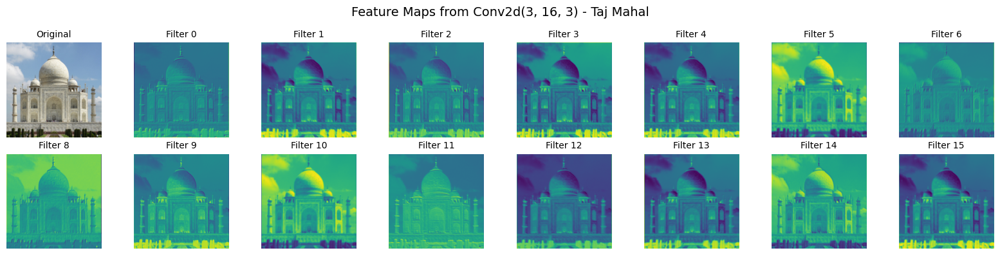

💾 Saved: outputs/04_feature_maps_conv2d.png


In [13]:
# Visualize feature maps จาก Conv2d
print("\n" + "=" * 60)
print("🔬 Visualizing Feature Maps")
print("=" * 60)

fig, axes = plt.subplots(2, 8, figsize=(16, 4))

# แถวแรก: Original + Feature maps 0-6
axes[0, 0].imshow(image_tensor.permute(1, 2, 0).numpy())
axes[0, 0].set_title('Original', fontsize=10)
axes[0, 0].axis('off')

for i in range(7):
    feat_map = output1[0, i].detach().numpy()
    axes[0, i+1].imshow(feat_map, cmap='viridis')
    axes[0, i+1].set_title(f'Filter {i}', fontsize=10)
    axes[0, i+1].axis('off')

# แถวสอง: Feature maps 7-15
for i in range(8):
    feat_map = output1[0, i+8].detach().numpy()
    axes[1, i].imshow(feat_map, cmap='viridis')
    axes[1, i].set_title(f'Filter {i+8}', fontsize=10)
    axes[1, i].axis('off')

plt.suptitle('Feature Maps from Conv2d(3, 16, 3) - Taj Mahal', fontsize=14)
plt.tight_layout()
plt.savefig('outputs/04_feature_maps_conv2d.png', dpi=100, bbox_inches='tight')
plt.show()
print("💾 Saved: outputs/04_feature_maps_conv2d.png")

### 5.1 Stride - ระยะการเลื่อนของ Filter

In [14]:
print("=" * 60)
print("👟 Stride - Filter Step Size")
print("=" * 60)

print("""
Stride = How many pixels the filter moves each step

Stride = 1: Move 1 pixel at a time -> output similar to input
Stride = 2: Move 2 pixels at a time -> output roughly half size
""")

# เปรียบเทียบ stride ต่างๆ
conv_s1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
conv_s2 = nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1)
conv_s4 = nn.Conv2d(3, 16, kernel_size=3, stride=4, padding=1)

out_s1 = conv_s1(image_batch)
out_s2 = conv_s2(image_batch)
out_s4 = conv_s4(image_batch)

print(f"\nInput: {image_batch.shape}")
print(f"Stride=1: {image_batch.shape} -> {out_s1.shape}")
print(f"Stride=2: {image_batch.shape} -> {out_s2.shape}")
print(f"Stride=4: {image_batch.shape} -> {out_s4.shape}")

👟 Stride - Filter Step Size

Stride = How many pixels the filter moves each step

Stride = 1: Move 1 pixel at a time -> output similar to input
Stride = 2: Move 2 pixels at a time -> output roughly half size


Input: torch.Size([1, 3, 256, 256])
Stride=1: torch.Size([1, 3, 256, 256]) -> torch.Size([1, 16, 256, 256])
Stride=2: torch.Size([1, 3, 256, 256]) -> torch.Size([1, 16, 128, 128])
Stride=4: torch.Size([1, 3, 256, 256]) -> torch.Size([1, 16, 64, 64])


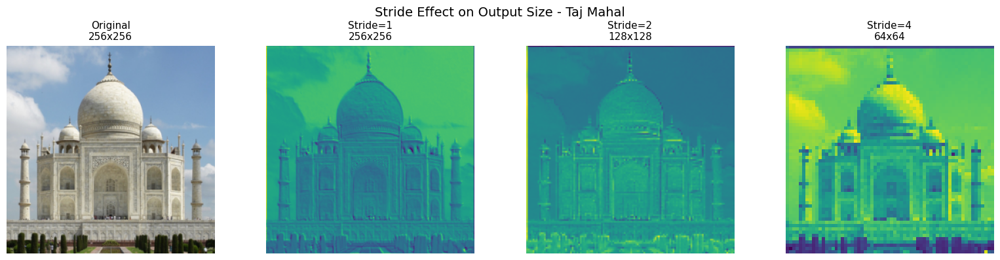

💾 Saved: outputs/05_stride_effect.png


In [15]:
# Visualize stride effect
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

axes[0].imshow(image_tensor.permute(1, 2, 0).numpy())
axes[0].set_title(f'Original\n{image_batch.shape[-2]}x{image_batch.shape[-1]}', fontsize=11)
axes[0].axis('off')

axes[1].imshow(out_s1[0, 0].detach().numpy(), cmap='viridis')
axes[1].set_title(f'Stride=1\n{out_s1.shape[-2]}x{out_s1.shape[-1]}', fontsize=11)
axes[1].axis('off')

axes[2].imshow(out_s2[0, 0].detach().numpy(), cmap='viridis')
axes[2].set_title(f'Stride=2\n{out_s2.shape[-2]}x{out_s2.shape[-1]}', fontsize=11)
axes[2].axis('off')

axes[3].imshow(out_s4[0, 0].detach().numpy(), cmap='viridis')
axes[3].set_title(f'Stride=4\n{out_s4.shape[-2]}x{out_s4.shape[-1]}', fontsize=11)
axes[3].axis('off')

plt.suptitle('Stride Effect on Output Size - Taj Mahal', fontsize=14)
plt.tight_layout()
plt.savefig('outputs/05_stride_effect.png', dpi=100, bbox_inches='tight')
plt.show()
print("💾 Saved: outputs/05_stride_effect.png")

### 5.2 Padding - การเพิ่มขอบรอบรูป

In [16]:
print("=" * 60)
print("🔲 Padding - Adding Border Pixels")
print("=" * 60)

print("""
Padding = Number of pixels added around the image border (usually zeros)

padding=0 (valid): Output shrinks
padding=k//2 (same): Output same size as input
""")

# เปรียบเทียบ padding
conv_p0 = nn.Conv2d(3, 16, kernel_size=5, padding=0)  # valid
conv_p2 = nn.Conv2d(3, 16, kernel_size=5, padding=2)  # same
conv_p4 = nn.Conv2d(3, 16, kernel_size=5, padding=4)  # more padding

out_p0 = conv_p0(image_batch)
out_p2 = conv_p2(image_batch)
out_p4 = conv_p4(image_batch)

print(f"\nKernel size = 5x5")
print(f"Input: {image_batch.shape[-2]}x{image_batch.shape[-1]}")
print(f"padding=0: {out_p0.shape[-2]}x{out_p0.shape[-1]} (shrinks by {256-out_p0.shape[-2]} pixels)")
print(f"padding=2: {out_p2.shape[-2]}x{out_p2.shape[-1]} (same size - 'same' padding)")
print(f"padding=4: {out_p4.shape[-2]}x{out_p4.shape[-1]} (grows)")

🔲 Padding - Adding Border Pixels

Padding = Number of pixels added around the image border (usually zeros)

padding=0 (valid): Output shrinks
padding=k//2 (same): Output same size as input


Kernel size = 5x5
Input: 256x256
padding=0: 252x252 (shrinks by 4 pixels)
padding=2: 256x256 (same size - 'same' padding)
padding=4: 260x260 (grows)


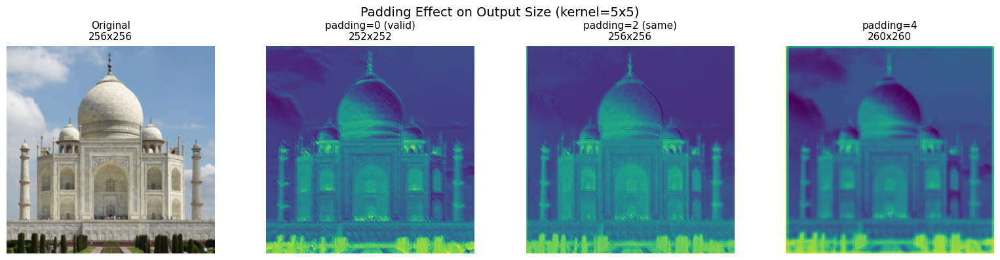

💾 Saved: outputs/06_padding_effect.png


In [17]:
# Visualize padding effect
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

axes[0].imshow(image_tensor.permute(1, 2, 0).numpy())
axes[0].set_title(f'Original\n{image_batch.shape[-2]}x{image_batch.shape[-1]}', fontsize=11)
axes[0].axis('off')

axes[1].imshow(out_p0[0, 0].detach().numpy(), cmap='viridis')
axes[1].set_title(f'padding=0 (valid)\n{out_p0.shape[-2]}x{out_p0.shape[-1]}', fontsize=11)
axes[1].axis('off')

axes[2].imshow(out_p2[0, 0].detach().numpy(), cmap='viridis')
axes[2].set_title(f'padding=2 (same)\n{out_p2.shape[-2]}x{out_p2.shape[-1]}', fontsize=11)
axes[2].axis('off')

axes[3].imshow(out_p4[0, 0].detach().numpy(), cmap='viridis')
axes[3].set_title(f'padding=4\n{out_p4.shape[-2]}x{out_p4.shape[-1]}', fontsize=11)
axes[3].axis('off')

plt.suptitle('Padding Effect on Output Size (kernel=5x5)', fontsize=14)
plt.tight_layout()
plt.show()
print("💾 Saved: outputs/06_padding_effect.png")

### 5.3 สูตรคำนวณ Output Size (สำคัญมาก!)

$$H_{out} = \lfloor \frac{H_{in} + 2 \times padding - kernel\_size}{stride} + 1 \rfloor$$

In [18]:
print("=" * 60)
print("📐 Output Size Formula (MUST KNOW!)")
print("=" * 60)

def calc_output_size(input_size, kernel_size, stride=1, padding=0, dilation=1):
    """Calculate output size after convolution"""
    return (input_size + 2 * padding - dilation * (kernel_size - 1) - 1) // stride + 1

print("""
Main Formula (when dilation=1):

         H_in + 2*padding - kernel_size
H_out = --------------------------------- + 1
                    stride
""")

# ตัวอย่างการคำนวณกับรูป Taj Mahal (256×256)
print("\n🧮 Calculations with Taj Mahal (256x256)")
print("-" * 50)

examples = [
    {"k": 3, "s": 1, "p": 1, "desc": "Conv(3x3, s=1, p=1) - Same"},
    {"k": 3, "s": 2, "p": 1, "desc": "Conv(3x3, s=2, p=1) - Downsample"},
    {"k": 5, "s": 1, "p": 0, "desc": "Conv(5x5, s=1, p=0) - Valid"},
    {"k": 5, "s": 1, "p": 2, "desc": "Conv(5x5, s=1, p=2) - Same"},
    {"k": 7, "s": 2, "p": 3, "desc": "Conv(7x7, s=2, p=3) - ResNet style"},
]

H_in = 256
for ex in examples:
    H_out = calc_output_size(H_in, ex["k"], ex["s"], ex["p"])
    print(f"\n{ex['desc']}")
    print(f"   H_out = ({H_in} + 2*{ex['p']} - {ex['k']}) / {ex['s']} + 1")
    print(f"         = ({H_in + 2*ex['p'] - ex['k']}) / {ex['s']} + 1")
    print(f"         = {H_out}")

📐 Output Size Formula (MUST KNOW!)

Main Formula (when dilation=1):

         H_in + 2*padding - kernel_size
H_out = --------------------------------- + 1
                    stride


🧮 Calculations with Taj Mahal (256x256)
--------------------------------------------------

Conv(3x3, s=1, p=1) - Same
   H_out = (256 + 2*1 - 3) / 1 + 1
         = (255) / 1 + 1
         = 256

Conv(3x3, s=2, p=1) - Downsample
   H_out = (256 + 2*1 - 3) / 2 + 1
         = (255) / 2 + 1
         = 128

Conv(5x5, s=1, p=0) - Valid
   H_out = (256 + 2*0 - 5) / 1 + 1
         = (251) / 1 + 1
         = 252

Conv(5x5, s=1, p=2) - Same
   H_out = (256 + 2*2 - 5) / 1 + 1
         = (255) / 1 + 1
         = 256

Conv(7x7, s=2, p=3) - ResNet style
   H_out = (256 + 2*3 - 7) / 2 + 1
         = (255) / 2 + 1
         = 128


In [19]:
# ตรวจสอบกับ PyTorch จริง
print("\n" + "=" * 60)
print("✅ Verify with PyTorch")
print("=" * 60)

for ex in examples:
    conv = nn.Conv2d(3, 16, kernel_size=ex["k"], stride=ex["s"], padding=ex["p"])
    output = conv(image_batch)
    calc = calc_output_size(256, ex["k"], ex["s"], ex["p"])
    actual = output.shape[-1]
    status = "✓" if calc == actual else "✗"
    print(f"{ex['desc']}")
    print(f"   Calculated: {calc}, Actual: {actual} {status}")


✅ Verify with PyTorch
Conv(3x3, s=1, p=1) - Same
   Calculated: 256, Actual: 256 ✓
Conv(3x3, s=2, p=1) - Downsample
   Calculated: 128, Actual: 128 ✓
Conv(5x5, s=1, p=0) - Valid
   Calculated: 252, Actual: 252 ✓
Conv(5x5, s=1, p=2) - Same
   Calculated: 256, Actual: 256 ✓
Conv(7x7, s=2, p=3) - ResNet style
   Calculated: 128, Actual: 128 ✓


### 5.4 Dilation - Dilated Convolution

In [20]:
print("=" * 60)
print("🔳 Dilation - Dilated Convolution")
print("=" * 60)

print("""
Dilation adds "gaps" between filter elements
-> Increases Receptive Field without adding parameters

Dilation=1 (normal):    Dilation=2:
+---+---+---+           +---+---+---+---+---+
| X | X | X |           | X |   | X |   | X |
+---+---+---+           +---+---+---+---+---+
| X | X | X |           |   |   |   |   |   |
+---+---+---+           +---+---+---+---+---+
| X | X | X |           | X |   | X |   | X |
+---+---+---+           +---+---+---+---+---+
Effective: 3x3          Effective: 5x5
""")

# เปรียบเทียบ dilation
conv_d1 = nn.Conv2d(3, 16, kernel_size=3, dilation=1, padding=1)
conv_d2 = nn.Conv2d(3, 16, kernel_size=3, dilation=2, padding=2)
conv_d4 = nn.Conv2d(3, 16, kernel_size=3, dilation=4, padding=4)

out_d1 = conv_d1(image_batch)
out_d2 = conv_d2(image_batch)
out_d4 = conv_d4(image_batch)

print(f"\nKernel size = 3x3")
print(f"dilation=1: Effective kernel 3x3,  Output: {out_d1.shape[-2]}x{out_d1.shape[-1]}")
print(f"dilation=2: Effective kernel 5x5,  Output: {out_d2.shape[-2]}x{out_d2.shape[-1]}")
print(f"dilation=4: Effective kernel 9x9,  Output: {out_d4.shape[-2]}x{out_d4.shape[-1]}")

params_d1 = sum(p.numel() for p in conv_d1.parameters())
print(f"\n💡 Parameters are the same for all dilations: {params_d1}")

🔳 Dilation - Dilated Convolution

Dilation adds "gaps" between filter elements
-> Increases Receptive Field without adding parameters

Dilation=1 (normal):    Dilation=2:
+---+---+---+           +---+---+---+---+---+
| X | X | X |           | X |   | X |   | X |
+---+---+---+           +---+---+---+---+---+
| X | X | X |           |   |   |   |   |   |
+---+---+---+           +---+---+---+---+---+
| X | X | X |           | X |   | X |   | X |
+---+---+---+           +---+---+---+---+---+
Effective: 3x3          Effective: 5x5


Kernel size = 3x3
dilation=1: Effective kernel 3x3,  Output: 256x256
dilation=2: Effective kernel 5x5,  Output: 256x256
dilation=4: Effective kernel 9x9,  Output: 256x256

💡 Parameters are the same for all dilations: 448


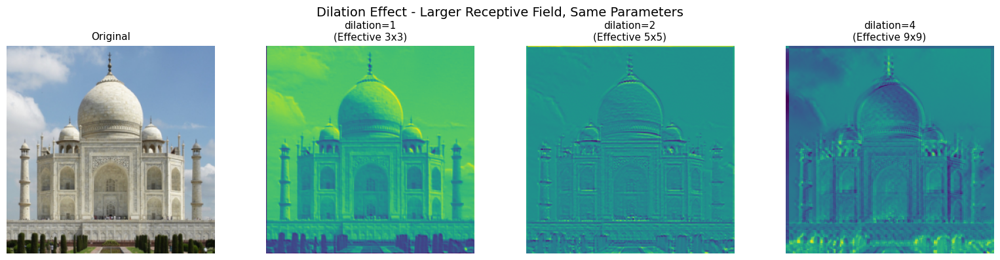

💾 Saved: outputs/07_dilation_effect.png


In [21]:
# Visualize dilation effect
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

axes[0].imshow(image_tensor.permute(1, 2, 0).numpy())
axes[0].set_title(f'Original', fontsize=11)
axes[0].axis('off')

axes[1].imshow(out_d1[0, 0].detach().numpy(), cmap='viridis')
axes[1].set_title(f'dilation=1\n(Effective 3x3)', fontsize=11)
axes[1].axis('off')

axes[2].imshow(out_d2[0, 0].detach().numpy(), cmap='viridis')
axes[2].set_title(f'dilation=2\n(Effective 5x5)', fontsize=11)
axes[2].axis('off')

axes[3].imshow(out_d4[0, 0].detach().numpy(), cmap='viridis')
axes[3].set_title(f'dilation=4\n(Effective 9x9)', fontsize=11)
axes[3].axis('off')

plt.suptitle('Dilation Effect - Larger Receptive Field, Same Parameters', fontsize=14)
plt.tight_layout()
plt.show()
print("💾 Saved: outputs/07_dilation_effect.png")

## ส่วนที่ 6: Activation Functions

In [22]:
print("=" * 60)
print("⚡ Activation Functions")
print("=" * 60)

# Apply conv แล้วดู activation
conv = nn.Conv2d(3, 1, kernel_size=3, padding=1, bias=False)
conv_output = conv(image_batch)

# Apply different activations
relu_output = F.relu(conv_output)
leaky_relu_output = F.leaky_relu(conv_output, 0.1)
sigmoid_output = torch.sigmoid(conv_output)
tanh_output = torch.tanh(conv_output)

⚡ Activation Functions


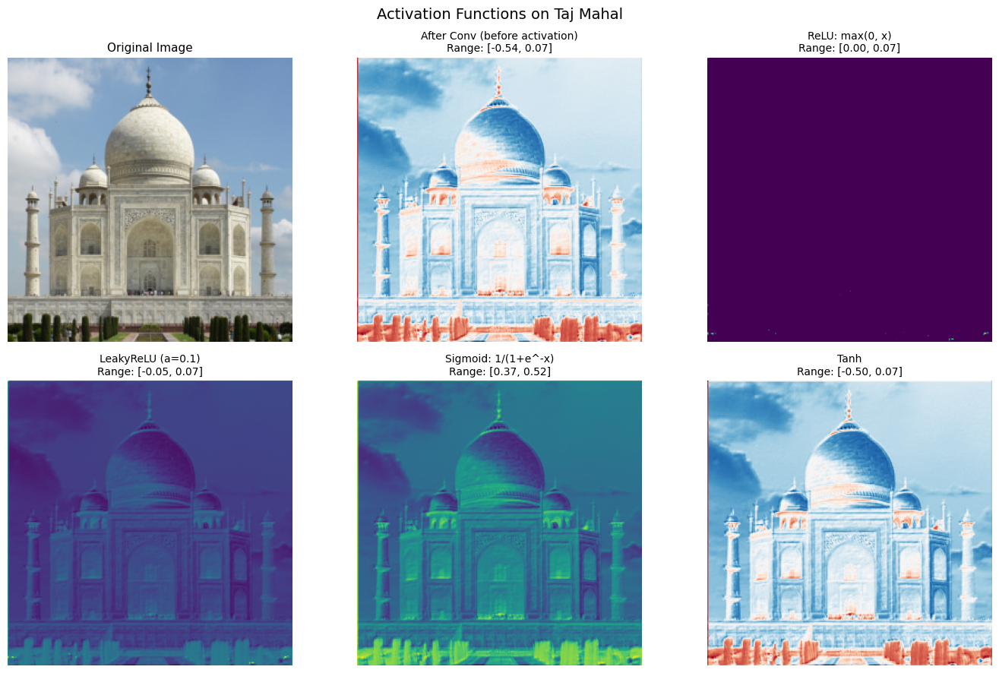

💾 Saved: outputs/08_activations.png


In [23]:
# Visualize activations
fig, axes = plt.subplots(2, 3, figsize=(14, 9))

# Row 1
axes[0, 0].imshow(image_tensor.permute(1, 2, 0).numpy())
axes[0, 0].set_title('Original Image', fontsize=11)
axes[0, 0].axis('off')

axes[0, 1].imshow(conv_output[0, 0].detach().numpy(), cmap='RdBu_r')
axes[0, 1].set_title(f'After Conv (before activation)\nRange: [{conv_output.min():.2f}, {conv_output.max():.2f}]', fontsize=10)
axes[0, 1].axis('off')

axes[0, 2].imshow(relu_output[0, 0].detach().numpy(), cmap='viridis')
axes[0, 2].set_title(f'ReLU: max(0, x)\nRange: [{relu_output.min():.2f}, {relu_output.max():.2f}]', fontsize=10)
axes[0, 2].axis('off')

# Row 2
axes[1, 0].imshow(leaky_relu_output[0, 0].detach().numpy(), cmap='viridis')
axes[1, 0].set_title(f'LeakyReLU (a=0.1)\nRange: [{leaky_relu_output.min():.2f}, {leaky_relu_output.max():.2f}]', fontsize=10)
axes[1, 0].axis('off')

axes[1, 1].imshow(sigmoid_output[0, 0].detach().numpy(), cmap='viridis')
axes[1, 1].set_title(f'Sigmoid: 1/(1+e^-x)\nRange: [{sigmoid_output.min():.2f}, {sigmoid_output.max():.2f}]', fontsize=10)
axes[1, 1].axis('off')

axes[1, 2].imshow(tanh_output[0, 0].detach().numpy(), cmap='RdBu_r')
axes[1, 2].set_title(f'Tanh\nRange: [{tanh_output.min():.2f}, {tanh_output.max():.2f}]', fontsize=10)
axes[1, 2].axis('off')

plt.suptitle('Activation Functions on Taj Mahal', fontsize=14)
plt.tight_layout()
plt.show()
print("💾 Saved: outputs/08_activations.png")

## ส่วนที่ 7: Batch Normalization

In [24]:
print("=" * 60)
print("📊 Batch Normalization")
print("=" * 60)

print("""
BatchNorm normalizes activations to have mean~0 and variance~1

Benefits:
- Stabilizes training
- Allows higher learning rates
- Acts as regularization
""")

# สร้าง Conv + BN block
conv_only = nn.Conv2d(3, 16, kernel_size=3, padding=1)
conv_with_bn = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, padding=1, bias=False),
    nn.BatchNorm2d(16)
)

# Forward
out_conv = conv_only(image_batch)
out_conv_bn = conv_with_bn(image_batch)

print(f"\nConv only:")
print(f"   Mean: {out_conv.mean():.4f}")
print(f"   Std:  {out_conv.std():.4f}")

print(f"\nConv + BatchNorm:")
print(f"   Mean: {out_conv_bn.mean():.4f}")
print(f"   Std:  {out_conv_bn.std():.4f}")
print(f"   -> Values normalized to mean~0, std~1")

📊 Batch Normalization

BatchNorm normalizes activations to have mean~0 and variance~1

Benefits:
- Stabilizes training
- Allows higher learning rates
- Acts as regularization


Conv only:
   Mean: 0.1356
   Std:  0.3747

Conv + BatchNorm:
   Mean: 0.0000
   Std:  0.9990
   -> Values normalized to mean~0, std~1


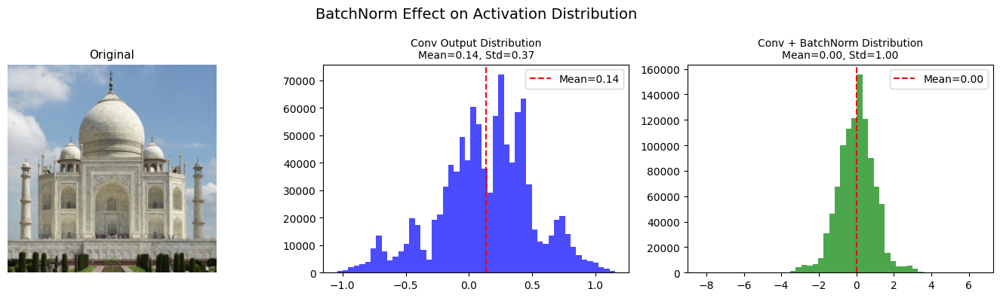

💾 Saved: outputs/09_batchnorm.png


In [25]:
# Visualize BatchNorm effect
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

axes[0].imshow(image_tensor.permute(1, 2, 0).numpy())
axes[0].set_title('Original', fontsize=11)
axes[0].axis('off')

# Conv output histogram
axes[1].hist(out_conv.detach().numpy().flatten(), bins=50, alpha=0.7, color='blue')
axes[1].axvline(x=out_conv.mean().item(), color='red', linestyle='--', label=f'Mean={out_conv.mean():.2f}')
axes[1].set_title(f'Conv Output Distribution\nMean={out_conv.mean():.2f}, Std={out_conv.std():.2f}', fontsize=10)
axes[1].legend()

# Conv + BN output histogram
axes[2].hist(out_conv_bn.detach().numpy().flatten(), bins=50, alpha=0.7, color='green')
axes[2].axvline(x=out_conv_bn.mean().item(), color='red', linestyle='--', label=f'Mean={out_conv_bn.mean():.2f}')
axes[2].set_title(f'Conv + BatchNorm Distribution\nMean={out_conv_bn.mean():.2f}, Std={out_conv_bn.std():.2f}', fontsize=10)
axes[2].legend()

plt.suptitle('BatchNorm Effect on Activation Distribution', fontsize=14)
plt.tight_layout()
plt.show()


## ส่วนที่ 8: Pooling Operations

In [26]:
print("=" * 60)
print("🔽 Pooling Operations")
print("=" * 60)

# Apply pooling
maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
avgpool = nn.AvgPool2d(kernel_size=2, stride=2)
gap = nn.AdaptiveAvgPool2d(1)

out_max = maxpool(image_batch)
out_avg = avgpool(image_batch)
out_gap = gap(image_batch)

print(f"Input: {image_batch.shape}")
print(f"\nMaxPool2d(2, 2): {out_max.shape}")
print(f"AvgPool2d(2, 2): {out_avg.shape}")
print(f"AdaptiveAvgPool2d(1): {out_gap.shape}")
print(f"  -> GAP always outputs 1x1 regardless of input size")

🔽 Pooling Operations
Input: torch.Size([1, 3, 256, 256])

MaxPool2d(2, 2): torch.Size([1, 3, 128, 128])
AvgPool2d(2, 2): torch.Size([1, 3, 128, 128])
AdaptiveAvgPool2d(1): torch.Size([1, 3, 1, 1])
  -> GAP always outputs 1x1 regardless of input size


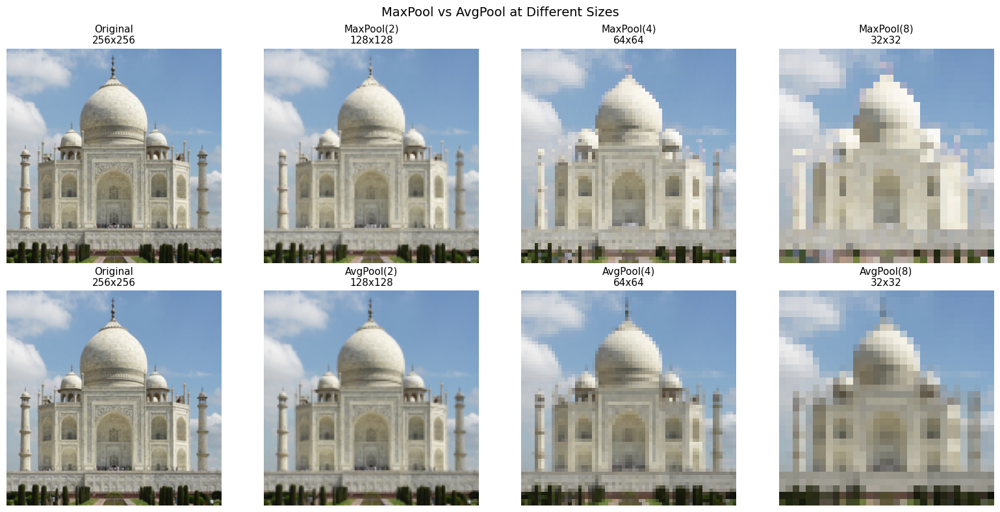

💾 Saved: outputs/10_pooling.png


In [27]:
# Visualize pooling
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Row 1: MaxPool at different sizes
axes[0, 0].imshow(image_tensor.permute(1, 2, 0).numpy())
axes[0, 0].set_title(f'Original\n{image_batch.shape[-2]}x{image_batch.shape[-1]}', fontsize=11)
axes[0, 0].axis('off')

out_max2 = nn.MaxPool2d(2)(image_batch)
axes[0, 1].imshow(out_max2[0].permute(1, 2, 0).numpy())
axes[0, 1].set_title(f'MaxPool(2)\n{out_max2.shape[-2]}x{out_max2.shape[-1]}', fontsize=11)
axes[0, 1].axis('off')

out_max4 = nn.MaxPool2d(4)(image_batch)
axes[0, 2].imshow(out_max4[0].permute(1, 2, 0).numpy())
axes[0, 2].set_title(f'MaxPool(4)\n{out_max4.shape[-2]}x{out_max4.shape[-1]}', fontsize=11)
axes[0, 2].axis('off')

out_max8 = nn.MaxPool2d(8)(image_batch)
axes[0, 3].imshow(out_max8[0].permute(1, 2, 0).numpy())
axes[0, 3].set_title(f'MaxPool(8)\n{out_max8.shape[-2]}x{out_max8.shape[-1]}', fontsize=11)
axes[0, 3].axis('off')

# Row 2: AvgPool at different sizes
axes[1, 0].imshow(image_tensor.permute(1, 2, 0).numpy())
axes[1, 0].set_title(f'Original\n{image_batch.shape[-2]}x{image_batch.shape[-1]}', fontsize=11)
axes[1, 0].axis('off')

out_avg2 = nn.AvgPool2d(2)(image_batch)
axes[1, 1].imshow(out_avg2[0].permute(1, 2, 0).numpy())
axes[1, 1].set_title(f'AvgPool(2)\n{out_avg2.shape[-2]}x{out_avg2.shape[-1]}', fontsize=11)
axes[1, 1].axis('off')

out_avg4 = nn.AvgPool2d(4)(image_batch)
axes[1, 2].imshow(out_avg4[0].permute(1, 2, 0).numpy())
axes[1, 2].set_title(f'AvgPool(4)\n{out_avg4.shape[-2]}x{out_avg4.shape[-1]}', fontsize=11)
axes[1, 2].axis('off')

out_avg8 = nn.AvgPool2d(8)(image_batch)
axes[1, 3].imshow(out_avg8[0].permute(1, 2, 0).numpy())
axes[1, 3].set_title(f'AvgPool(8)\n{out_avg8.shape[-2]}x{out_avg8.shape[-1]}', fontsize=11)
axes[1, 3].axis('off')

plt.suptitle('MaxPool vs AvgPool at Different Sizes', fontsize=14)
plt.tight_layout()
plt.show()


## ส่วนที่ 9: Convolution Variants

### 9.1 1×1 Convolution

In [28]:
print("=" * 60)
print("🔘 1x1 Convolution")
print("=" * 60)

print("""
1x1 Conv is used for:
1. Changing number of channels (bottleneck)
2. Channel mixing
3. Adding nonlinearity

Does NOT change spatial size (H, W)
""")

# ลองใช้ 1×1 conv
conv1x1_reduce = nn.Conv2d(3, 1, kernel_size=1)   # RGB -> single channel
conv1x1_expand = nn.Conv2d(3, 8, kernel_size=1)   # RGB -> 8 channels

out_reduce = conv1x1_reduce(image_batch)
out_expand = conv1x1_expand(image_batch)

print(f"Input: {image_batch.shape}")
print(f"1x1 Conv (3->1): {out_reduce.shape}")
print(f"1x1 Conv (3->8): {out_expand.shape}")

🔘 1x1 Convolution

1x1 Conv is used for:
1. Changing number of channels (bottleneck)
2. Channel mixing
3. Adding nonlinearity

Does NOT change spatial size (H, W)

Input: torch.Size([1, 3, 256, 256])
1x1 Conv (3->1): torch.Size([1, 1, 256, 256])
1x1 Conv (3->8): torch.Size([1, 8, 256, 256])


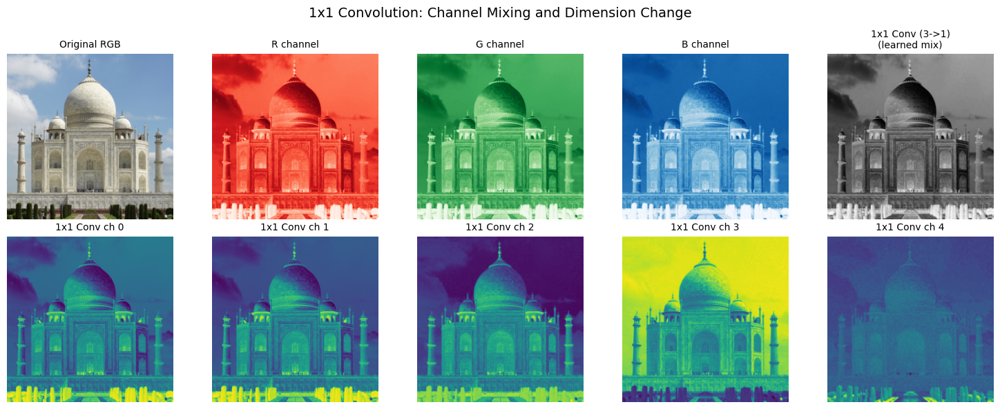

💾 Saved: outputs/11_1x1_conv.png


In [29]:
# Visualize 1×1 conv
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

# Row 1: RGB channels
axes[0, 0].imshow(image_tensor.permute(1, 2, 0).numpy())
axes[0, 0].set_title('Original RGB', fontsize=10)
axes[0, 0].axis('off')

axes[0, 1].imshow(image_tensor[0].numpy(), cmap='Reds')
axes[0, 1].set_title('R channel', fontsize=10)
axes[0, 1].axis('off')

axes[0, 2].imshow(image_tensor[1].numpy(), cmap='Greens')
axes[0, 2].set_title('G channel', fontsize=10)
axes[0, 2].axis('off')

axes[0, 3].imshow(image_tensor[2].numpy(), cmap='Blues')
axes[0, 3].set_title('B channel', fontsize=10)
axes[0, 3].axis('off')

axes[0, 4].imshow(out_reduce[0, 0].detach().numpy(), cmap='gray')
axes[0, 4].set_title('1x1 Conv (3->1)\n(learned mix)', fontsize=10)
axes[0, 4].axis('off')

# Row 2: 1×1 Conv 3→8
for i in range(5):
    axes[1, i].imshow(out_expand[0, i].detach().numpy(), cmap='viridis')
    axes[1, i].set_title(f'1x1 Conv ch {i}', fontsize=10)
    axes[1, i].axis('off')

plt.suptitle('1x1 Convolution: Channel Mixing and Dimension Change', fontsize=14)
plt.tight_layout()
plt.show()
print("💾 Saved: outputs/11_1x1_conv.png")

### 9.2 Depthwise Separable Convolution

In [30]:
print("=" * 60)
print("🔀 Depthwise Separable Convolution")
print("=" * 60)

class DepthwiseSeparableConv(nn.Module):
    """MobileNet-style Depthwise Separable Conv"""
    def __init__(self, in_ch, out_ch, kernel_size=3, stride=1, padding=1):
        super().__init__()
        self.depthwise = nn.Conv2d(in_ch, in_ch, kernel_size, stride, padding, groups=in_ch, bias=False)
        self.pointwise = nn.Conv2d(in_ch, out_ch, 1, bias=True)
    
    def forward(self, x):
        x = self.depthwise(x)
        x = self.pointwise(x)
        return x

# เปรียบเทียบ
conv_standard = nn.Conv2d(3, 16, 3, padding=1)
conv_dw_sep = DepthwiseSeparableConv(3, 16)

params_std = sum(p.numel() for p in conv_standard.parameters())
params_dw = sum(p.numel() for p in conv_dw_sep.parameters())

print(f"Standard Conv (3->16, 3x3):")
print(f"   Parameters: {params_std}")

print(f"\nDepthwise Separable (3->16):")
print(f"   Parameters: {params_dw}")
print(f"   Reduction: {(1-params_dw/params_std)*100:.1f}%")

out_std = conv_standard(image_batch)
out_dw = conv_dw_sep(image_batch)

print(f"\nOutput shapes:")
print(f"   Standard: {out_std.shape}")
print(f"   Depthwise Sep: {out_dw.shape}")

🔀 Depthwise Separable Convolution
Standard Conv (3->16, 3x3):
   Parameters: 448

Depthwise Separable (3->16):
   Parameters: 91
   Reduction: 79.7%

Output shapes:
   Standard: torch.Size([1, 16, 256, 256])
   Depthwise Sep: torch.Size([1, 16, 256, 256])


## ส่วนที่ 10: สร้าง CNN Model สำหรับรูป Taj Mahal

In [31]:
print("=" * 60)
print("🏗️ Building CNN Model")
print("=" * 60)

class SimpleCNN(nn.Module):
    """
    Simple CNN for demonstration
    Input: (N, 3, 256, 256)
    Output: Feature vector
    """
    def __init__(self):
        super().__init__()
        
        # Block 1: 256 -> 128
        self.block1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2)
        )
        
        # Block 2: 128 -> 64
        self.block2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2)
        )
        
        # Block 3: 64 -> 32
        self.block3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2)
        )
        
        # Block 4: 32 -> 16
        self.block4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2)
        )
        
        # Global Average Pooling
        self.gap = nn.AdaptiveAvgPool2d(1)
        
    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.gap(x)
        x = x.view(x.size(0), -1)
        return x

model = SimpleCNN()
print(model)

🏗️ Building CNN Model
SimpleCNN(
  (block1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool

In [32]:
# แสดง Shape Flow
print("\n" + "=" * 60)
print("🔍 Shape Flow Through Layers")
print("=" * 60)

x = image_batch.clone()
print(f"Input: {x.shape}")

x1 = model.block1(x)
print(f"After Block 1: {x1.shape}")

x2 = model.block2(x1)
print(f"After Block 2: {x2.shape}")

x3 = model.block3(x2)
print(f"After Block 3: {x3.shape}")

x4 = model.block4(x3)
print(f"After Block 4: {x4.shape}")

x5 = model.gap(x4)
print(f"After GAP: {x5.shape}")

x6 = x5.view(x5.size(0), -1)
print(f"After Flatten: {x6.shape}")


🔍 Shape Flow Through Layers
Input: torch.Size([1, 3, 256, 256])
After Block 1: torch.Size([1, 32, 128, 128])
After Block 2: torch.Size([1, 64, 64, 64])
After Block 3: torch.Size([1, 128, 32, 32])
After Block 4: torch.Size([1, 256, 16, 16])
After GAP: torch.Size([1, 256, 1, 1])
After Flatten: torch.Size([1, 256])



🔬 Feature Maps from CNN Model


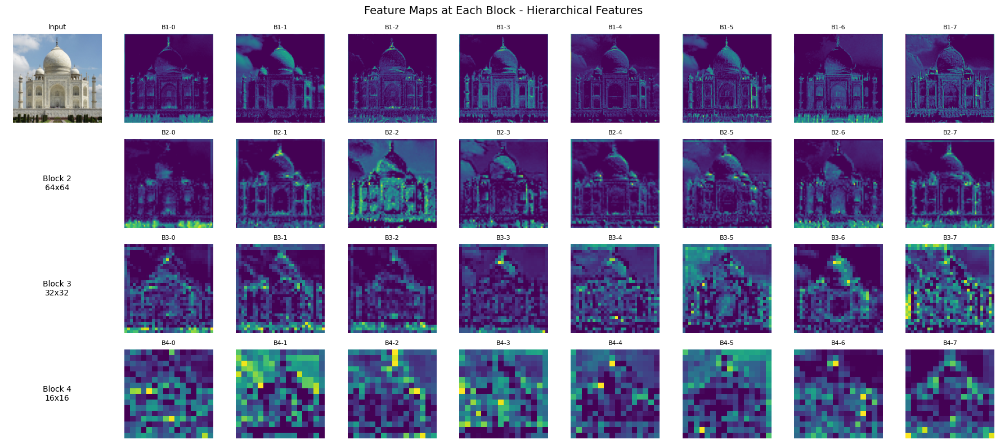

💾 Saved: outputs/12_cnn_feature_maps.png


In [33]:
# Visualize feature maps จาก CNN
print("\n" + "=" * 60)
print("🔬 Feature Maps from CNN Model")
print("=" * 60)

# Get feature maps from each block
with torch.no_grad():
    f1 = model.block1(image_batch)
    f2 = model.block2(f1)
    f3 = model.block3(f2)
    f4 = model.block4(f3)

fig, axes = plt.subplots(4, 9, figsize=(18, 8))

# Block 1
axes[0, 0].imshow(image_tensor.permute(1, 2, 0).numpy())
axes[0, 0].set_title('Input', fontsize=9)
axes[0, 0].axis('off')
for i in range(8):
    axes[0, i+1].imshow(f1[0, i].numpy(), cmap='viridis')
    axes[0, i+1].set_title(f'B1-{i}', fontsize=8)
    axes[0, i+1].axis('off')

# Block 2
axes[1, 0].text(0.5, 0.5, f'Block 2\n{f2.shape[-2]}x{f2.shape[-1]}', 
                ha='center', va='center', fontsize=10, transform=axes[1, 0].transAxes)
axes[1, 0].axis('off')
for i in range(8):
    axes[1, i+1].imshow(f2[0, i].numpy(), cmap='viridis')
    axes[1, i+1].set_title(f'B2-{i}', fontsize=8)
    axes[1, i+1].axis('off')

# Block 3
axes[2, 0].text(0.5, 0.5, f'Block 3\n{f3.shape[-2]}x{f3.shape[-1]}', 
                ha='center', va='center', fontsize=10, transform=axes[2, 0].transAxes)
axes[2, 0].axis('off')
for i in range(8):
    axes[2, i+1].imshow(f3[0, i].numpy(), cmap='viridis')
    axes[2, i+1].set_title(f'B3-{i}', fontsize=8)
    axes[2, i+1].axis('off')

# Block 4
axes[3, 0].text(0.5, 0.5, f'Block 4\n{f4.shape[-2]}x{f4.shape[-1]}', 
                ha='center', va='center', fontsize=10, transform=axes[3, 0].transAxes)
axes[3, 0].axis('off')
for i in range(8):
    axes[3, i+1].imshow(f4[0, i].numpy(), cmap='viridis')
    axes[3, i+1].set_title(f'B4-{i}', fontsize=8)
    axes[3, i+1].axis('off')

plt.suptitle('Feature Maps at Each Block - Hierarchical Features', fontsize=14)
plt.tight_layout()
plt.savefig('outputs/12_cnn_feature_maps.png', dpi=100, bbox_inches='tight')
plt.show()
print("💾 Saved: outputs/12_cnn_feature_maps.png")

## ส่วนที่ 11: Data Augmentation

🎨 Data Augmentation


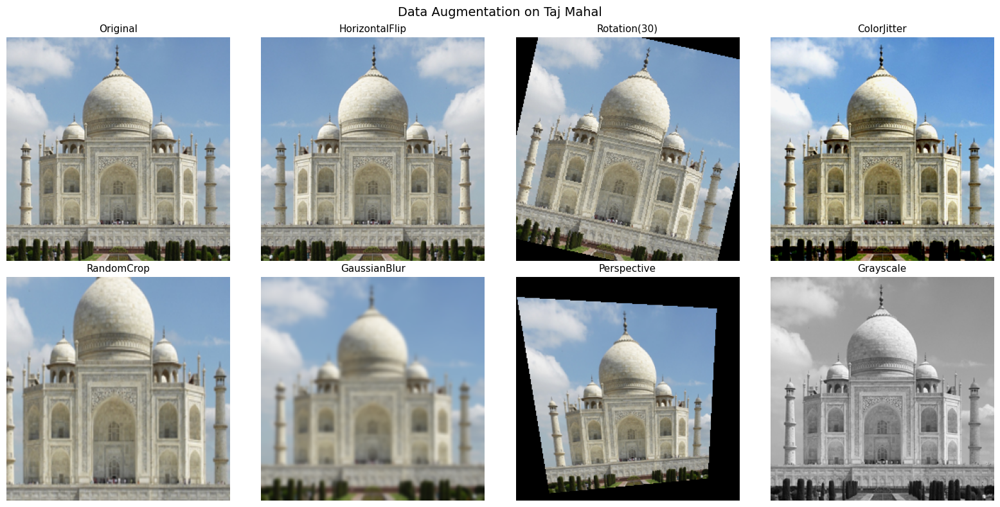

💾 Saved: outputs/13_data_augmentation.png


In [34]:
print("=" * 60)
print("🎨 Data Augmentation")
print("=" * 60)

# โหลดรูปใหม่เพื่อทำ augmentation
pil_image = Image.open(IMG_PATH).resize((256, 256))

augmentations = {
    'Original': transforms.Compose([]),
    'HorizontalFlip': transforms.RandomHorizontalFlip(p=1.0),
    'Rotation(30)': transforms.RandomRotation(30),
    'ColorJitter': transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
    'RandomCrop': transforms.RandomResizedCrop(256, scale=(0.6, 1.0)),
    'GaussianBlur': transforms.GaussianBlur(kernel_size=9),
    'Perspective': transforms.RandomPerspective(distortion_scale=0.3, p=1.0),
    'Grayscale': transforms.Grayscale(num_output_channels=3),
}

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for idx, (name, aug) in enumerate(augmentations.items()):
    img_aug = aug(pil_image)
    axes[idx].imshow(img_aug)
    axes[idx].set_title(name, fontsize=11)
    axes[idx].axis('off')

plt.suptitle('Data Augmentation on Taj Mahal', fontsize=14)
plt.tight_layout()
plt.show()
#print("💾 Saved: outputs/13_data_augmentation.png")

## ส่วนที่ 12: Receptive Field

In [35]:
print("=" * 60)
print("👁️ Receptive Field")
print("=" * 60)

print("""
Receptive Field = Region of input that affects one output unit

Each layer increases receptive field:

Layer 1 (3x3):  RF = 3x3
Layer 2 (3x3):  RF = 5x5
Layer 3 (3x3):  RF = 7x7
    ...

Stride>1 or pooling -> RF grows faster
""")

def calc_receptive_field(layers):
    """Calculate receptive field"""
    rf = 1
    stride_product = 1
    
    for k, s in layers:
        rf = rf + (k - 1) * stride_product
        stride_product *= s
    
    return rf

# เลเยอร์ในโมเดล
layers_block1 = [(3, 1), (3, 1), (2, 2)]  # 2 conv + pool
layers_block2 = [(3, 1), (3, 1), (2, 2)]
layers_block3 = [(3, 1), (3, 1), (2, 2)]
layers_block4 = [(3, 1), (3, 1), (2, 2)]

all_layers = layers_block1 + layers_block2 + layers_block3 + layers_block4

print("\n📊 Receptive Field at Each Block:")
rf = 1
stride_product = 1
block_num = 0
for i, (k, s) in enumerate(all_layers):
    rf = rf + (k - 1) * stride_product
    stride_product *= s
    if (i + 1) % 3 == 0:  # After each block (2 conv + 1 pool)
        block_num += 1
        print(f"   After Block {block_num}: RF = {rf}x{rf} pixels")

print(f"\n🎯 Final Receptive Field: {rf}x{rf} pixels")
print(f"   From 256x256 image, each output unit sees {rf}x{rf} pixels!")

👁️ Receptive Field

Receptive Field = Region of input that affects one output unit

Each layer increases receptive field:

Layer 1 (3x3):  RF = 3x3
Layer 2 (3x3):  RF = 5x5
Layer 3 (3x3):  RF = 7x7
    ...

Stride>1 or pooling -> RF grows faster


📊 Receptive Field at Each Block:
   After Block 1: RF = 6x6 pixels
   After Block 2: RF = 16x16 pixels
   After Block 3: RF = 36x36 pixels
   After Block 4: RF = 76x76 pixels

🎯 Final Receptive Field: 76x76 pixels
   From 256x256 image, each output unit sees 76x76 pixels!


---
# 🆕 ส่วนที่ 13: Pretrained Models (NEW!)

**Pretrained Models** คือโมเดลที่ถูก train มาแล้วบน dataset ขนาดใหญ่ เช่น ImageNet
เราสามารถใช้ weights เหล่านี้เป็นจุดเริ่มต้นสำหรับ task ของเราได้ (Transfer Learning)

**ประโยชน์:**
- ไม่ต้อง train จาก scratch
- ใช้ความรู้ที่เรียนมาจาก ImageNet (1.2M รูป, 1000 classes)
- Features ที่เรียนมาสามารถ generalize ได้ดี
---

### 13.1 โหลด Pretrained Models ยอดนิยม

In [36]:
print("=" * 60)
print("🎯 Loading Pretrained Models")
print("=" * 60)

print("""
Popular Pretrained Models in torchvision.models:

+----------------+----------+------------+---------------+
| Model          | Params   | Top-1 Acc  | Year          |
+----------------+----------+------------+---------------+
| AlexNet        | 61M      | 56.5%      | 2012          |
| VGG16          | 138M     | 71.6%      | 2014          |
| VGG19          | 143M     | 72.4%      | 2014          |
| ResNet18       | 11.7M    | 69.8%      | 2015          |
| ResNet50       | 25.6M    | 76.1%      | 2015          |
| ResNet101      | 44.5M    | 77.4%      | 2015          |
| DenseNet121    | 8M       | 74.4%      | 2017          |
| MobileNetV2    | 3.5M     | 71.9%      | 2018          |
| EfficientNet   | 5.3M     | 77.1%      | 2019          |
| ViT            | 86M      | 81.1%      | 2020          |
+----------------+----------+------------+---------------+
""")

🎯 Loading Pretrained Models

Popular Pretrained Models in torchvision.models:

+----------------+----------+------------+---------------+
| Model          | Params   | Top-1 Acc  | Year          |
+----------------+----------+------------+---------------+
| AlexNet        | 61M      | 56.5%      | 2012          |
| VGG16          | 138M     | 71.6%      | 2014          |
| VGG19          | 143M     | 72.4%      | 2014          |
| ResNet18       | 11.7M    | 69.8%      | 2015          |
| ResNet50       | 25.6M    | 76.1%      | 2015          |
| ResNet101      | 44.5M    | 77.4%      | 2015          |
| DenseNet121    | 8M       | 74.4%      | 2017          |
| MobileNetV2    | 3.5M     | 71.9%      | 2018          |
| EfficientNet   | 5.3M     | 77.1%      | 2019          |
| ViT            | 86M      | 81.1%      | 2020          |
+----------------+----------+------------+---------------+



In [37]:
# โหลด pretrained models
print("\n📥 Loading pretrained models...")

# ResNet18 - เล็ก เร็ว เหมาะสำหรับเรียนรู้
resnet18 = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
resnet18.eval()
print("✅ Loaded ResNet18")

# VGG16 - classic architecture, ใช้แค่ 3x3 conv
vgg16 = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
vgg16.eval()
print("✅ Loaded VGG16")

# ResNet50 - deeper, more powerful
resnet50 = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
resnet50.eval()
print("✅ Loaded ResNet50")

# MobileNetV2 - lightweight, efficient
mobilenet = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)
mobilenet.eval()
print("✅ Loaded MobileNetV2")

# EfficientNet-B0 - efficient scaling
efficientnet = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)
efficientnet.eval()
print("✅ Loaded EfficientNet-B0")


📥 Loading pretrained models...
✅ Loaded ResNet18
✅ Loaded VGG16
✅ Loaded ResNet50
✅ Loaded MobileNetV2
✅ Loaded EfficientNet-B0


In [38]:
# แสดงโครงสร้างของ ResNet18
print("\n" + "=" * 60)
print("🏗️ ResNet18 Architecture")
print("=" * 60)

print(resnet18)


🏗️ ResNet18 Architecture
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (re

In [39]:
# นับ parameters ของแต่ละ model
print("\n" + "=" * 60)
print("📊 Model Parameters Comparison")
print("=" * 60)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters())

models_dict = {
    'ResNet18': resnet18,
    'ResNet50': resnet50,
    'VGG16': vgg16,
    'MobileNetV2': mobilenet,
    'EfficientNet-B0': efficientnet,
}

for name, model in models_dict.items():
    params = count_parameters(model)
    print(f"{name:20s}: {params:>12,} parameters ({params/1e6:.1f}M)")


📊 Model Parameters Comparison
ResNet18            :   11,689,512 parameters (11.7M)
ResNet50            :   25,557,032 parameters (25.6M)
VGG16               :  138,357,544 parameters (138.4M)
MobileNetV2         :    3,504,872 parameters (3.5M)
EfficientNet-B0     :    5,288,548 parameters (5.3M)


### 13.2 Preprocessing สำหรับ Pretrained Models

In [40]:
print("=" * 60)
print("🔧 ImageNet Preprocessing")
print("=" * 60)

print("""
ImageNet pretrained models expect:
- Input size: 224x224 (most models)
- Normalized with ImageNet mean and std:
  - mean = [0.485, 0.456, 0.406]
  - std = [0.229, 0.224, 0.225]
- RGB format
""")

# Transform สำหรับ pretrained models
imagenet_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# แปลงรูป Taj Mahal
image_imagenet = imagenet_transform(original_image)
image_imagenet_batch = image_imagenet.unsqueeze(0)

print(f"\n📐 Transformed image for ImageNet models:")
print(f"   Shape: {image_imagenet_batch.shape}")
print(f"   Min: {image_imagenet_batch.min():.4f}")
print(f"   Max: {image_imagenet_batch.max():.4f}")

# สำหรับแสดงผล (denormalize)
def denormalize_imagenet(tensor):
    """Denormalize ImageNet tensor for visualization"""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    tensor = tensor * std + mean
    return torch.clamp(tensor, 0, 1)

🔧 ImageNet Preprocessing

ImageNet pretrained models expect:
- Input size: 224x224 (most models)
- Normalized with ImageNet mean and std:
  - mean = [0.485, 0.456, 0.406]
  - std = [0.229, 0.224, 0.225]
- RGB format


📐 Transformed image for ImageNet models:
   Shape: torch.Size([1, 3, 224, 224])
   Min: -1.8439
   Max: 2.5006


### 13.3 Classification ด้วย Pretrained Model

In [41]:
print("=" * 60)
print("🏷️ ImageNet Classification")
print("=" * 60)

# โหลด ImageNet class names
IMAGENET_LABELS_URL = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"

# ลองโหลด labels (ถ้าไม่มี internet ใช้ index แทน)
try:
    import urllib.request
    with urllib.request.urlopen(IMAGENET_LABELS_URL) as f:
        imagenet_labels = [line.decode('utf-8').strip() for line in f.readlines()]
    print("✅ Loaded ImageNet labels")
except:
    imagenet_labels = [f"class_{i}" for i in range(1000)]
    print("⚠️ Could not load ImageNet labels, using indices")

🏷️ ImageNet Classification
✅ Loaded ImageNet labels


In [42]:
# ทำนายด้วย ResNet18
print("\n🔮 Predictions for Taj Mahal image:")
print("-" * 50)

with torch.no_grad():
    # ResNet18
    outputs_resnet18 = resnet18(image_imagenet_batch)
    probs_resnet18 = F.softmax(outputs_resnet18, dim=1)
    top5_resnet18 = torch.topk(probs_resnet18, 5)
    
    print("\n📌 ResNet18 Top-5 Predictions:")
    for i, (prob, idx) in enumerate(zip(top5_resnet18.values[0], top5_resnet18.indices[0])):
        print(f"   {i+1}. {imagenet_labels[idx]:30s} ({prob.item()*100:.2f}%)")


🔮 Predictions for Taj Mahal image:
--------------------------------------------------

📌 ResNet18 Top-5 Predictions:
   1. mosque                         (85.98%)
   2. palace                         (9.68%)
   3. dome                           (3.78%)
   4. monastery                      (0.19%)
   5. church                         (0.18%)


In [43]:
# เปรียบเทียบ predictions จากหลายโมเดล
print("\n" + "=" * 60)
print("🔄 Comparing Predictions from Different Models")
print("=" * 60)

with torch.no_grad():
    predictions = {}
    
    for name, model in [('ResNet18', resnet18), ('ResNet50', resnet50), 
                        ('VGG16', vgg16), ('MobileNetV2', mobilenet)]:
        outputs = model(image_imagenet_batch)
        probs = F.softmax(outputs, dim=1)
        top1_prob, top1_idx = probs.max(dim=1)
        predictions[name] = {
            'label': imagenet_labels[top1_idx.item()],
            'prob': top1_prob.item()
        }
        print(f"\n{name}:")
        print(f"   Prediction: {predictions[name]['label']}")
        print(f"   Confidence: {predictions[name]['prob']*100:.2f}%")


🔄 Comparing Predictions from Different Models

ResNet18:
   Prediction: mosque
   Confidence: 85.98%

ResNet50:
   Prediction: mosque
   Confidence: 98.01%

VGG16:
   Prediction: mosque
   Confidence: 95.00%

MobileNetV2:
   Prediction: mosque
   Confidence: 94.67%


### 13.4 Feature Extraction จาก Pretrained Models

In [44]:
print("=" * 60)
print("🔬 Feature Extraction from Pretrained Models")
print("=" * 60)

print("""
เราสามารถดึง features จาก intermediate layers ได้หลายวิธี:

1. Forward Hooks - เก็บ output ขณะ forward pass
2. ตัด model ออกเป็นส่วนๆ
3. ใช้ torchvision.models.feature_extraction
""")

🔬 Feature Extraction from Pretrained Models

เราสามารถดึง features จาก intermediate layers ได้หลายวิธี:

1. Forward Hooks - เก็บ output ขณะ forward pass
2. ตัด model ออกเป็นส่วนๆ
3. ใช้ torchvision.models.feature_extraction



In [45]:
# วิธีที่ 1: ใช้ Forward Hooks
print("\n" + "=" * 60)
print("📌 Method 1: Forward Hooks")
print("=" * 60)

class FeatureExtractor:
    """Extract features using forward hooks"""
    def __init__(self, model, target_layers):
        self.model = model
        self.features = {}
        self.hooks = []
        
        # Register hooks
        for name, module in model.named_modules():
            if name in target_layers:
                hook = module.register_forward_hook(self._get_hook(name))
                self.hooks.append(hook)
    
    def _get_hook(self, name):
        def hook(module, input, output):
            self.features[name] = output.detach()
        return hook
    
    def __call__(self, x):
        self.features = {}
        _ = self.model(x)
        return self.features
    
    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()

# กำหนด layers ที่ต้องการดึง features
resnet18_layers = ['conv1', 'layer1', 'layer2', 'layer3', 'layer4']

# สร้าง feature extractor
feature_extractor = FeatureExtractor(resnet18, resnet18_layers)

# ดึง features
with torch.no_grad():
    features = feature_extractor(image_imagenet_batch)

print("Extracted features from ResNet18:")
for name, feat in features.items():
    print(f"   {name:10s}: {feat.shape}")

# ลบ hooks
feature_extractor.remove_hooks()


📌 Method 1: Forward Hooks
Extracted features from ResNet18:
   conv1     : torch.Size([1, 64, 112, 112])
   layer1    : torch.Size([1, 64, 56, 56])
   layer2    : torch.Size([1, 128, 28, 28])
   layer3    : torch.Size([1, 256, 14, 14])
   layer4    : torch.Size([1, 512, 7, 7])


In [46]:
# วิธีที่ 2: ตัด model (สำหรับ ResNet)
print("\n" + "=" * 60)
print("📌 Method 2: Split Model into Parts")
print("=" * 60)

class ResNet18FeatureExtractor(nn.Module):
    """ResNet18 with feature extraction at each stage"""
    def __init__(self, pretrained=True):
        super().__init__()
        if pretrained:
            resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        else:
            resnet = models.resnet18()
        
        # แบ่งเป็น stages
        self.stem = nn.Sequential(
            resnet.conv1,
            resnet.bn1,
            resnet.relu,
            resnet.maxpool
        )
        self.layer1 = resnet.layer1  # 64 channels
        self.layer2 = resnet.layer2  # 128 channels
        self.layer3 = resnet.layer3  # 256 channels
        self.layer4 = resnet.layer4  # 512 channels
        
    def forward(self, x):
        features = {}
        
        x = self.stem(x)
        features['stem'] = x
        
        x = self.layer1(x)
        features['layer1'] = x
        
        x = self.layer2(x)
        features['layer2'] = x
        
        x = self.layer3(x)
        features['layer3'] = x
        
        x = self.layer4(x)
        features['layer4'] = x
        
        return features

# สร้างและทดสอบ
resnet18_feat = ResNet18FeatureExtractor(pretrained=True)
resnet18_feat.eval()

with torch.no_grad():
    features_resnet18 = resnet18_feat(image_imagenet_batch)

print("Features from ResNet18FeatureExtractor:")
for name, feat in features_resnet18.items():
    print(f"   {name:10s}: {feat.shape}")


📌 Method 2: Split Model into Parts
Features from ResNet18FeatureExtractor:
   stem      : torch.Size([1, 64, 56, 56])
   layer1    : torch.Size([1, 64, 56, 56])
   layer2    : torch.Size([1, 128, 28, 28])
   layer3    : torch.Size([1, 256, 14, 14])
   layer4    : torch.Size([1, 512, 7, 7])


In [47]:
# วิธีที่ 3: ใช้ torchvision.models.feature_extraction
print("\n" + "=" * 60)
print("📌 Method 3: torchvision.models.feature_extraction")
print("=" * 60)

from torchvision.models.feature_extraction import create_feature_extractor, get_graph_node_names

# ดู node names ที่สามารถดึงได้
train_nodes, eval_nodes = get_graph_node_names(resnet18)
print("Available nodes (first 20):")
for node in eval_nodes[:20]:
    print(f"   {node}")


📌 Method 3: torchvision.models.feature_extraction
Available nodes (first 20):
   x
   conv1
   bn1
   relu
   maxpool
   layer1.0.conv1
   layer1.0.bn1
   layer1.0.relu
   layer1.0.conv2
   layer1.0.bn2
   layer1.0.add
   layer1.0.relu_1
   layer1.1.conv1
   layer1.1.bn1
   layer1.1.relu
   layer1.1.conv2
   layer1.1.bn2
   layer1.1.add
   layer1.1.relu_1
   layer2.0.conv1


In [48]:
# สร้าง feature extractor ด้วย torchvision API
return_nodes = {
    'relu': 'stem',           # After first conv + relu
    'layer1': 'layer1',       # After layer1
    'layer2': 'layer2',       # After layer2
    'layer3': 'layer3',       # After layer3
    'layer4': 'layer4',       # After layer4
}

resnet18_extractor = create_feature_extractor(resnet18, return_nodes=return_nodes)

with torch.no_grad():
    features_official = resnet18_extractor(image_imagenet_batch)

print("\nFeatures from official API:")
for name, feat in features_official.items():
    print(f"   {name:10s}: {feat.shape}")


Features from official API:
   stem      : torch.Size([1, 64, 112, 112])
   layer1    : torch.Size([1, 64, 56, 56])
   layer2    : torch.Size([1, 128, 28, 28])
   layer3    : torch.Size([1, 256, 14, 14])
   layer4    : torch.Size([1, 512, 7, 7])


### 13.5 Visualizing Feature Maps from Pretrained Models

🎨 Visualizing Feature Maps from Pretrained ResNet18


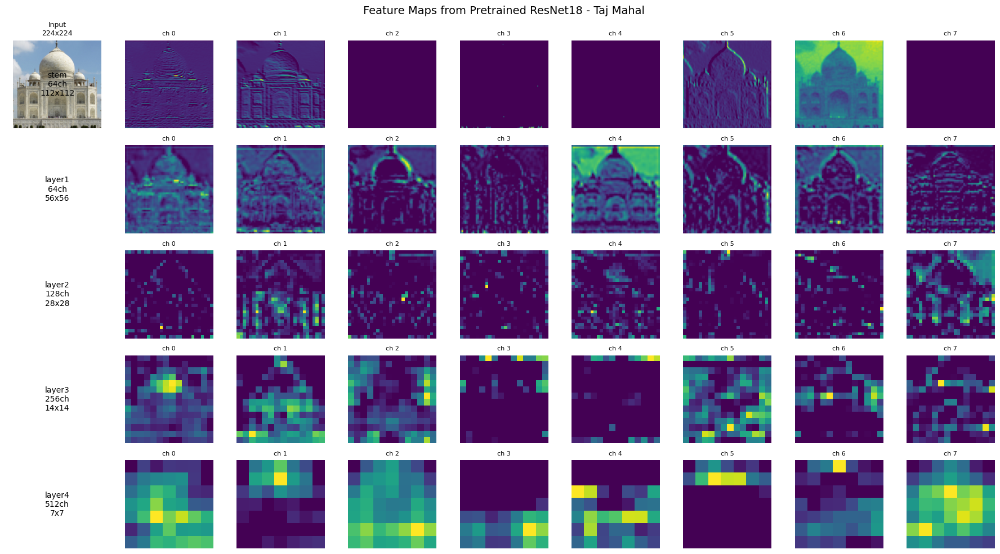

💾 Saved: outputs/14_pretrained_resnet18_features.png


In [49]:
print("=" * 60)
print("🎨 Visualizing Feature Maps from Pretrained ResNet18")
print("=" * 60)

# ใช้ features ที่ดึงมาแล้ว
fig, axes = plt.subplots(5, 9, figsize=(18, 10))

# Original image
denorm_img = denormalize_imagenet(image_imagenet)
axes[0, 0].imshow(denorm_img.permute(1, 2, 0).numpy())
axes[0, 0].set_title('Input\n224x224', fontsize=9)
axes[0, 0].axis('off')

# ซ่อน subplot ที่เหลือในแถวแรก
for i in range(1, 9):
    axes[0, i].axis('off')

# Features from each layer
layer_names = ['stem', 'layer1', 'layer2', 'layer3', 'layer4']
for row_idx, layer_name in enumerate(layer_names):
    feat = features_official[layer_name]
    n_channels = feat.shape[1]
    h, w = feat.shape[2], feat.shape[3]
    
    # แสดงข้อมูล layer
    axes[row_idx, 0].text(0.5, 0.5, 
                          f'{layer_name}\n{n_channels}ch\n{h}x{w}', 
                          ha='center', va='center', fontsize=10,
                          transform=axes[row_idx, 0].transAxes)
    axes[row_idx, 0].axis('off')
    
    # แสดง 8 feature maps แรก
    for i in range(8):
        feat_map = feat[0, i].numpy()
        axes[row_idx, i+1].imshow(feat_map, cmap='viridis')
        axes[row_idx, i+1].set_title(f'ch {i}', fontsize=8)
        axes[row_idx, i+1].axis('off')

plt.suptitle('Feature Maps from Pretrained ResNet18 - Taj Mahal', fontsize=14)
plt.tight_layout()
plt.show()
print("💾 Saved: outputs/14_pretrained_resnet18_features.png")

### 13.6 Visualizing VGG16 Features

In [50]:
print("=" * 60)
print("🎨 Visualizing Feature Maps from Pretrained VGG16")
print("=" * 60)

# VGG16 feature extraction
vgg16_return_nodes = {
    'features.4': 'block1',    # After first max pool
    'features.9': 'block2',    # After second max pool
    'features.16': 'block3',   # After third max pool
    'features.23': 'block4',   # After fourth max pool
    'features.30': 'block5',   # After fifth max pool
}

vgg16_extractor = create_feature_extractor(vgg16, return_nodes=vgg16_return_nodes)

with torch.no_grad():
    features_vgg16 = vgg16_extractor(image_imagenet_batch)

print("VGG16 Features:")
for name, feat in features_vgg16.items():
    print(f"   {name:10s}: {feat.shape}")

🎨 Visualizing Feature Maps from Pretrained VGG16
VGG16 Features:
   block1    : torch.Size([1, 64, 112, 112])
   block2    : torch.Size([1, 128, 56, 56])
   block3    : torch.Size([1, 256, 28, 28])
   block4    : torch.Size([1, 512, 14, 14])
   block5    : torch.Size([1, 512, 7, 7])


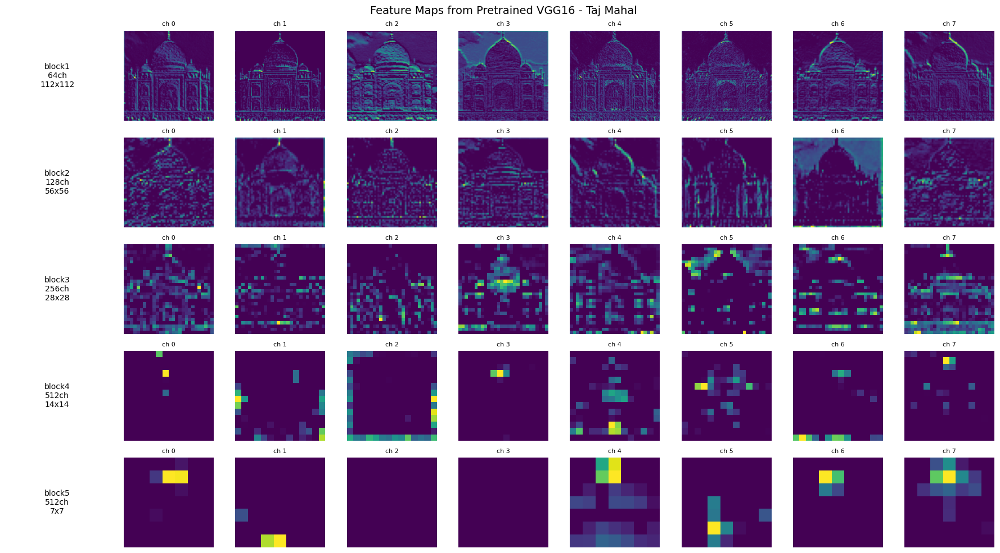

💾 Saved: outputs/15_pretrained_vgg16_features.png


In [51]:
# Visualize VGG16 features
fig, axes = plt.subplots(5, 9, figsize=(18, 10))

# Features from each block
for row_idx, (layer_name, feat) in enumerate(features_vgg16.items()):
    n_channels = feat.shape[1]
    h, w = feat.shape[2], feat.shape[3]
    
    # แสดงข้อมูล layer
    axes[row_idx, 0].text(0.5, 0.5, 
                          f'{layer_name}\n{n_channels}ch\n{h}x{w}', 
                          ha='center', va='center', fontsize=10,
                          transform=axes[row_idx, 0].transAxes)
    axes[row_idx, 0].axis('off')
    
    # แสดง 8 feature maps แรก
    for i in range(8):
        feat_map = feat[0, i].numpy()
        axes[row_idx, i+1].imshow(feat_map, cmap='viridis')
        axes[row_idx, i+1].set_title(f'ch {i}', fontsize=8)
        axes[row_idx, i+1].axis('off')

plt.suptitle('Feature Maps from Pretrained VGG16 - Taj Mahal', fontsize=14)
plt.tight_layout()
plt.show()
print("💾 Saved: outputs/15_pretrained_vgg16_features.png")

### 13.7 เปรียบเทียบ Features: Random vs Pretrained

In [52]:
print("=" * 60)
print("🔄 Comparing: Random Initialization vs Pretrained")
print("=" * 60)

# Random ResNet18
resnet18_random = models.resnet18(weights=None)  # No pretrained weights
resnet18_random.eval()

# Feature extractors
resnet18_random_extractor = create_feature_extractor(resnet18_random, return_nodes=return_nodes)
resnet18_pretrained_extractor = create_feature_extractor(resnet18, return_nodes=return_nodes)

with torch.no_grad():
    features_random = resnet18_random_extractor(image_imagenet_batch)
    features_pretrained = resnet18_pretrained_extractor(image_imagenet_batch)

🔄 Comparing: Random Initialization vs Pretrained


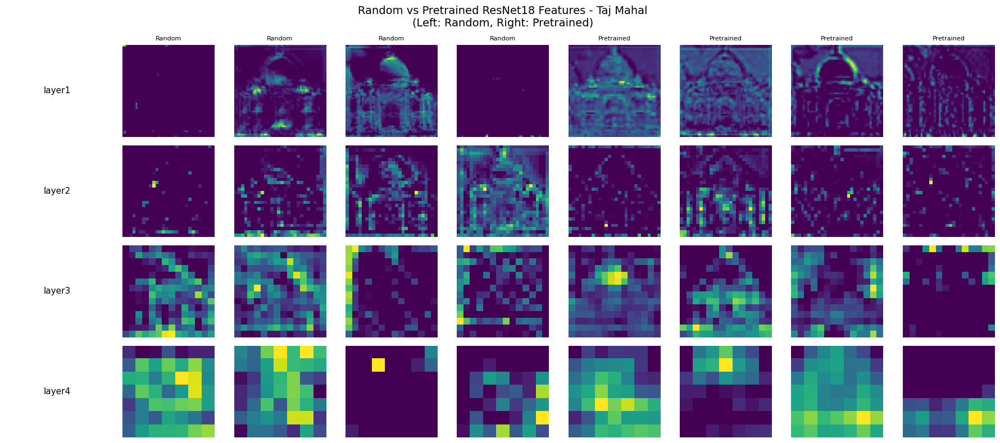

💾 Saved: outputs/16_random_vs_pretrained.png

📝 สังเกต:
- Random: Features ดูเหมือน noise ไม่มี pattern ชัดเจน
- Pretrained: Features จับ edges, textures, objects ได้ชัดเจน
- Deep layers ใน pretrained มี semantic meaning มากกว่า



In [53]:
# Visualize comparison
fig, axes = plt.subplots(4, 9, figsize=(18, 8))

layers_to_show = ['layer1', 'layer2', 'layer3', 'layer4']

for row_idx, layer_name in enumerate(layers_to_show):
    feat_random = features_random[layer_name]
    feat_pretrained = features_pretrained[layer_name]
    
    # Label
    axes[row_idx, 0].text(0.5, 0.5, layer_name, 
                          ha='center', va='center', fontsize=11,
                          transform=axes[row_idx, 0].transAxes)
    axes[row_idx, 0].axis('off')
    
    # Random (4 channels)
    for i in range(4):
        axes[row_idx, i+1].imshow(feat_random[0, i].numpy(), cmap='viridis')
        title = 'Random' if row_idx == 0 else ''
        axes[row_idx, i+1].set_title(title, fontsize=8)
        axes[row_idx, i+1].axis('off')
        if i == 0:
            axes[row_idx, i+1].set_ylabel('Random', fontsize=9)
    
    # Pretrained (4 channels)
    for i in range(4):
        axes[row_idx, i+5].imshow(feat_pretrained[0, i].numpy(), cmap='viridis')
        title = 'Pretrained' if row_idx == 0 else ''
        axes[row_idx, i+5].set_title(title, fontsize=8)
        axes[row_idx, i+5].axis('off')

plt.suptitle('Random vs Pretrained ResNet18 Features - Taj Mahal\n(Left: Random, Right: Pretrained)', fontsize=14)
plt.tight_layout()
plt.show()
print("💾 Saved: outputs/16_random_vs_pretrained.png")

print("""
📝 สังเกต:
- Random: Features ดูเหมือน noise ไม่มี pattern ชัดเจน
- Pretrained: Features จับ edges, textures, objects ได้ชัดเจน
- Deep layers ใน pretrained มี semantic meaning มากกว่า
""")

### 13.8 Visualizing Conv Filters from Pretrained Models

In [54]:
print("=" * 60)
print("🔍 Visualizing Learned Filters (First Conv Layer)")
print("=" * 60)

# ดึง weights จาก conv1 ของ ResNet18
conv1_weights = resnet18.conv1.weight.data.clone()
print(f"Conv1 weights shape: {conv1_weights.shape}")
print(f"-> 64 filters, 3 input channels, 7x7 kernel")

# Normalize weights สำหรับแสดงผล
def normalize_filter(filter_weights):
    """Normalize filter weights for visualization"""
    min_val = filter_weights.min()
    max_val = filter_weights.max()
    return (filter_weights - min_val) / (max_val - min_val + 1e-8)

🔍 Visualizing Learned Filters (First Conv Layer)
Conv1 weights shape: torch.Size([64, 3, 7, 7])
-> 64 filters, 3 input channels, 7x7 kernel


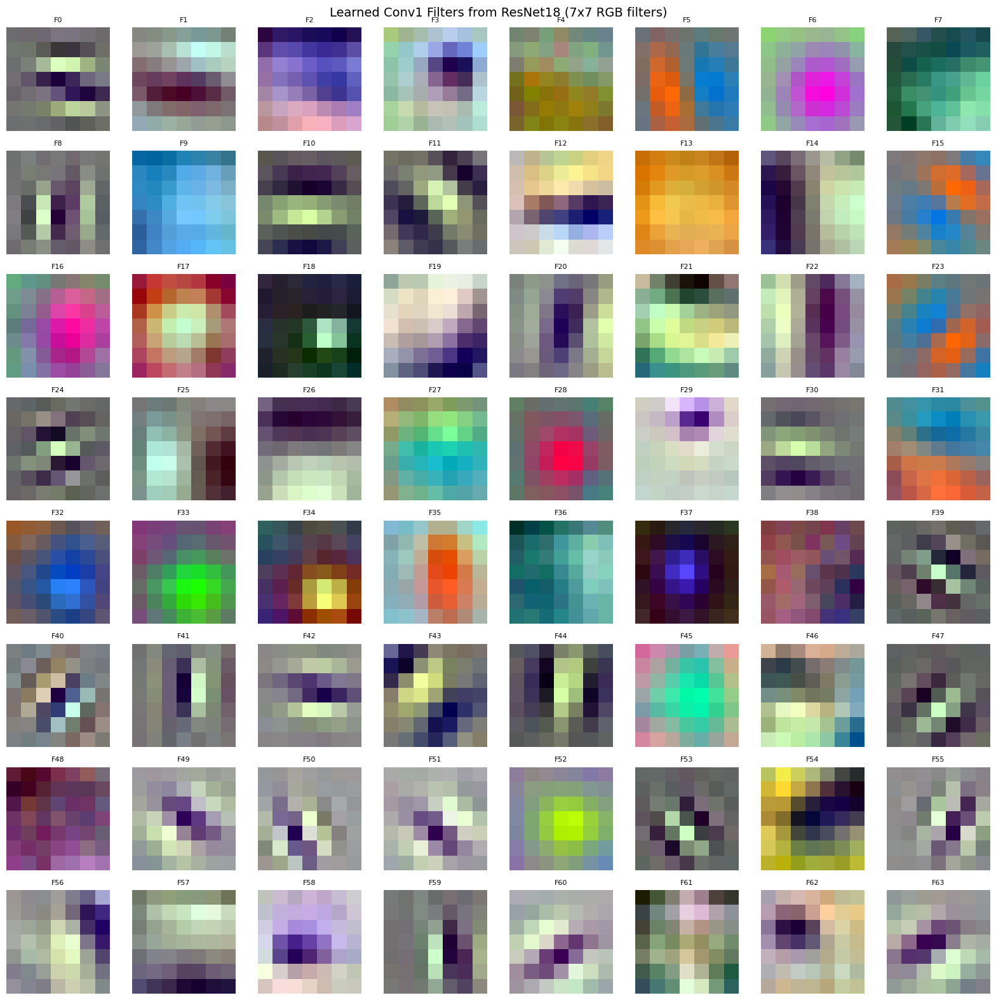

💾 Saved: outputs/17_resnet18_conv1_filters.png

📝 สังเกต:
- บาง filter ตรวจจับ edges ในทิศทางต่างๆ
- บาง filter ตรวจจับ color gradients
- บาง filter ตรวจจับ textures



In [55]:
# Visualize first 64 filters (as RGB images)
fig, axes = plt.subplots(8, 8, figsize=(16, 16))

for idx in range(64):
    row = idx // 8
    col = idx % 8
    
    # Get filter (3, 7, 7) and normalize
    filter_rgb = conv1_weights[idx]
    filter_normalized = normalize_filter(filter_rgb)
    
    # Convert to (7, 7, 3) for visualization
    axes[row, col].imshow(filter_normalized.permute(1, 2, 0).numpy())
    axes[row, col].set_title(f'F{idx}', fontsize=8)
    axes[row, col].axis('off')

plt.suptitle('Learned Conv1 Filters from ResNet18 (7x7 RGB filters)', fontsize=14)
plt.tight_layout()
plt.show()
print("💾 Saved: outputs/17_resnet18_conv1_filters.png")

print("""
📝 สังเกต:
- บาง filter ตรวจจับ edges ในทิศทางต่างๆ
- บาง filter ตรวจจับ color gradients
- บาง filter ตรวจจับ textures
""")

### 13.9 Feature Maps at Different Depths (Hierarchical Features)

In [56]:
print("=" * 60)
print("📊 Hierarchical Features Visualization")
print("=" * 60)

print("""
CNN learns hierarchical features:
- Early layers: Low-level features (edges, colors, textures)
- Middle layers: Mid-level features (patterns, parts)
- Deep layers: High-level features (objects, semantics)
""")

📊 Hierarchical Features Visualization

CNN learns hierarchical features:
- Early layers: Low-level features (edges, colors, textures)
- Middle layers: Mid-level features (patterns, parts)
- Deep layers: High-level features (objects, semantics)



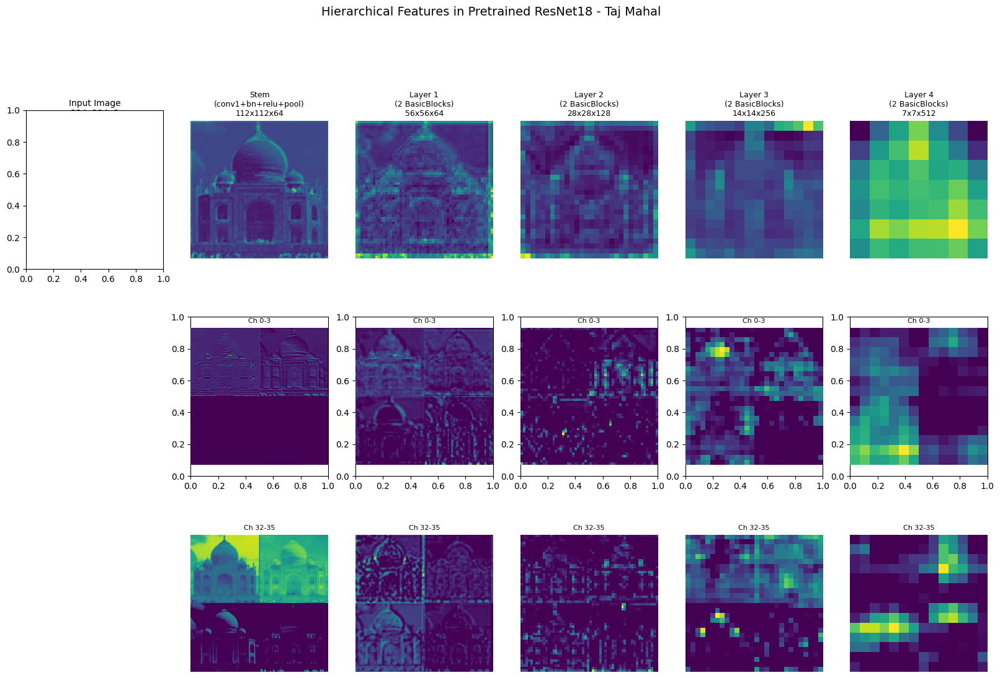

💾 Saved: outputs/18_hierarchical_features.png


In [57]:
# สร้าง comprehensive visualization
fig = plt.figure(figsize=(20, 12))

# Grid spec สำหรับ layout
from matplotlib.gridspec import GridSpec
gs = GridSpec(3, 6, figure=fig, hspace=0.3, wspace=0.2)

# Original image
ax_orig = fig.add_subplot(gs[0, 0])
ax_orig.imshow(denormalize_imagenet(image_imagenet).permute(1, 2, 0).numpy())
ax_orig.set_title('Input Image\n224x224x3', fontsize=10)
ax_orig.axis('off')

# ResNet18 layers
layer_info = [
    ('stem', 'Stem\n(conv1+bn+relu+pool)\n112x112x64', 0, 1),
    ('layer1', 'Layer 1\n(2 BasicBlocks)\n56x56x64', 0, 2),
    ('layer2', 'Layer 2\n(2 BasicBlocks)\n28x28x128', 0, 3),
    ('layer3', 'Layer 3\n(2 BasicBlocks)\n14x14x256', 0, 4),
    ('layer4', 'Layer 4\n(2 BasicBlocks)\n7x7x512', 0, 5),
]

for layer_name, title, row, col in layer_info:
    ax = fig.add_subplot(gs[row, col])
    feat = features_official[layer_name]
    
    # Average across channels สำหรับแสดงผลรวม
    feat_avg = feat[0].mean(dim=0).numpy()
    ax.imshow(feat_avg, cmap='viridis')
    ax.set_title(title, fontsize=9)
    ax.axis('off')

# Individual channels from each layer
for layer_idx, layer_name in enumerate(['stem', 'layer1', 'layer2', 'layer3', 'layer4']):
    feat = features_official[layer_name]
    
    # 4 sample channels
    for ch_idx in range(4):
        ax = fig.add_subplot(gs[1 + ch_idx // 4, layer_idx + 1])
        if ch_idx < 4:
            ax = fig.add_subplot(gs[1, layer_idx + 1])
            # Show 4 channels as 2x2 grid
            h, w = feat.shape[2], feat.shape[3]
            combined = np.zeros((h*2, w*2))
            for i in range(2):
                for j in range(2):
                    ch = i * 2 + j
                    if ch < feat.shape[1]:
                        combined[i*h:(i+1)*h, j*w:(j+1)*w] = feat[0, ch].numpy()
            ax.imshow(combined, cmap='viridis')
            ax.set_title(f'Ch 0-3', fontsize=8)
            ax.axis('off')
            break

# Row 3: Deep feature channels (different channels)
for layer_idx, layer_name in enumerate(['stem', 'layer1', 'layer2', 'layer3', 'layer4']):
    feat = features_official[layer_name]
    ax = fig.add_subplot(gs[2, layer_idx + 1])
    
    # Show different channels
    h, w = feat.shape[2], feat.shape[3]
    combined = np.zeros((h*2, w*2))
    start_ch = min(32, feat.shape[1] - 4)
    for i in range(2):
        for j in range(2):
            ch = start_ch + i * 2 + j
            if ch < feat.shape[1]:
                combined[i*h:(i+1)*h, j*w:(j+1)*w] = feat[0, ch].numpy()
    ax.imshow(combined, cmap='viridis')
    ax.set_title(f'Ch {start_ch}-{start_ch+3}', fontsize=8)
    ax.axis('off')

# Add arrow showing feature hierarchy
ax_text = fig.add_subplot(gs[0, 0])

plt.suptitle('Hierarchical Features in Pretrained ResNet18 - Taj Mahal', fontsize=14, y=1.02)
plt.show()
print("💾 Saved: outputs/18_hierarchical_features.png")

### 13.10 Transfer Learning: Fine-tuning Pretrained Model

In [58]:
print("=" * 60)
print("🎓 Transfer Learning Setup")
print("=" * 60)

print("""
Transfer Learning Strategies:

1. Feature Extraction (freeze all layers):
   - ใช้ pretrained model เป็น feature extractor
   - Train เฉพาะ classifier head ใหม่
   - เหมาะเมื่อมี data น้อย หรือ task คล้าย ImageNet

2. Fine-tuning (unfreeze some/all layers):
   - Train classifier head + บาง layers ของ backbone
   - เหมาะเมื่อมี data พอสมควร และ task ต่างจาก ImageNet

3. Full Fine-tuning:
   - Train ทุก layers
   - ใช้ learning rate ต่ำสำหรับ pretrained layers
   - เหมาะเมื่อมี data เยอะ
""")

🎓 Transfer Learning Setup

Transfer Learning Strategies:

1. Feature Extraction (freeze all layers):
   - ใช้ pretrained model เป็น feature extractor
   - Train เฉพาะ classifier head ใหม่
   - เหมาะเมื่อมี data น้อย หรือ task คล้าย ImageNet

2. Fine-tuning (unfreeze some/all layers):
   - Train classifier head + บาง layers ของ backbone
   - เหมาะเมื่อมี data พอสมควร และ task ต่างจาก ImageNet

3. Full Fine-tuning:
   - Train ทุก layers
   - ใช้ learning rate ต่ำสำหรับ pretrained layers
   - เหมาะเมื่อมี data เยอะ



In [59]:
# ตัวอย่าง: สร้าง classifier ใหม่สำหรับ 10 classes
class TransferResNet18(nn.Module):
    """ResNet18 for transfer learning"""
    def __init__(self, num_classes=10, pretrained=True, freeze_backbone=True):
        super().__init__()
        
        # โหลด pretrained ResNet18
        if pretrained:
            self.backbone = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        else:
            self.backbone = models.resnet18()
        
        # Freeze backbone (optional)
        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False
        
        # เปลี่ยน fc layer
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(in_features, num_classes)
        )
        
    def forward(self, x):
        return self.backbone(x)

# สร้าง model
transfer_model = TransferResNet18(num_classes=10, pretrained=True, freeze_backbone=True)

# นับ trainable parameters
total_params = sum(p.numel() for p in transfer_model.parameters())
trainable_params = sum(p.numel() for p in transfer_model.parameters() if p.requires_grad)

print(f"\n📊 TransferResNet18 (10 classes):")
print(f"   Total parameters:     {total_params:,}")
print(f"   Trainable parameters: {trainable_params:,}")
print(f"   Frozen parameters:    {total_params - trainable_params:,}")
print(f"   Trainable ratio:      {trainable_params/total_params*100:.2f}%")


📊 TransferResNet18 (10 classes):
   Total parameters:     11,181,642
   Trainable parameters: 5,130
   Frozen parameters:    11,176,512
   Trainable ratio:      0.05%


In [60]:
# ทดสอบ forward pass
print("\n🔄 Testing forward pass:")
with torch.no_grad():
    dummy_input = torch.randn(4, 3, 224, 224)  # Batch of 4
    output = transfer_model(dummy_input)
    print(f"   Input:  {dummy_input.shape}")
    print(f"   Output: {output.shape}")
    print(f"   -> Ready for 10-class classification!")


🔄 Testing forward pass:
   Input:  torch.Size([4, 3, 224, 224])
   Output: torch.Size([4, 10])
   -> Ready for 10-class classification!


### 13.11 สรุป Pretrained Models

In [61]:
print("""
+==============================================================================+
|                    PRETRAINED MODELS CHEAT SHEET                             |
+==============================================================================+
|                                                                              |
| LOADING PRETRAINED MODELS                                                    |
|    from torchvision import models                                            |
|    resnet18 = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1) |
|    vgg16 = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)          |
|                                                                              |
| IMAGENET PREPROCESSING                                                       |
|    transforms.Compose([                                                      |
|        transforms.Resize(256),                                               |
|        transforms.CenterCrop(224),                                           |
|        transforms.ToTensor(),                                                |
|        transforms.Normalize(mean=[0.485, 0.456, 0.406],                      |
|                             std=[0.229, 0.224, 0.225])                       |
|    ])                                                                        |
|                                                                              |
| FEATURE EXTRACTION                                                           |
|    from torchvision.models.feature_extraction import create_feature_extractor|
|    return_nodes = {'layer1': 'feat1', 'layer4': 'feat4'}                     |
|    extractor = create_feature_extractor(model, return_nodes=return_nodes)    |
|    features = extractor(input_tensor)                                        |
|                                                                              |
| TRANSFER LEARNING                                                            |
|    # Freeze backbone                                                         |
|    for param in model.parameters():                                          |
|        param.requires_grad = False                                           |
|                                                                              |
|    # Replace classifier                                                      |
|    model.fc = nn.Linear(in_features, num_classes)                            |
|                                                                              |
| TRAIN vs EVAL MODE                                                           |
|    model.train()  # For training (BatchNorm, Dropout active)                 |
|    model.eval()   # For inference (BatchNorm, Dropout inactive)              |
|                                                                              |
| POPULAR MODELS BY USE CASE                                                   |
|    Fast inference:    MobileNetV2, EfficientNet-B0                           |
|    High accuracy:     ResNet50, EfficientNet-B7, ViT                         |
|    Classic/Teaching:  VGG16, ResNet18                                        |
|    Detection:         ResNet (with FPN), EfficientNet                        |
|                                                                              |
+==============================================================================+
""")


+==============================================================================+
|                    PRETRAINED MODELS CHEAT SHEET                             |
+==============================================================================+
|                                                                              |
| LOADING PRETRAINED MODELS                                                    |
|    from torchvision import models                                            |
|    resnet18 = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1) |
|    vgg16 = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)          |
|                                                                              |
| IMAGENET PREPROCESSING                                                       |
|    transforms.Compose([                                                      |
|        transforms.Resize(256),                                               |
|        transforms.CenterC

## ส่วนที่ 14: Cheat Sheet (Updated)

In [62]:
print("""
+==============================================================================+
|                        CNN PYTORCH CHEAT SHEET                               |
+==============================================================================+
| TENSOR SHAPE                                                                 |
|    Images: (N, C, H, W) = Batch, Channels, Height, Width                     |
|    Example: (1, 3, 256, 256) = 1 RGB image 256x256                           |
|                                                                              |
| OUTPUT SIZE FORMULA                                                          |
|    H_out = (H_in + 2*padding - kernel_size) / stride + 1                     |
|                                                                              |
| SAME PADDING (preserve size)                                                 |
|    padding = kernel_size // 2  (for stride=1, odd kernel)                    |
|    kernel=3 -> p=1, kernel=5 -> p=2, kernel=7 -> p=3                         |
|                                                                              |
| COMMON BLOCK                                                                 |
|    nn.Sequential(                                                            |
|        nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),                   |
|        nn.BatchNorm2d(out_ch),                                               |
|        nn.ReLU(inplace=True),                                                |
|    )                                                                         |
|                                                                              |
| TIPS                                                                         |
|    - Conv + BatchNorm -> use bias=False (BN has its own bias)                |
|    - GAP -> Linear is better than Flatten -> Linear (fewer params)           |
|    - Stride=2 or Pool for downsampling                                       |
|    - 1x1 conv: change number of channels                                     |
|    - Dilation: increase receptive field, same params                         |
|                                                                              |
| TRAIN vs EVAL                                                                |
|    model.train()  # BN uses batch stats, Dropout active                      |
|    model.eval()   # BN uses running stats, Dropout off                       |
|                                                                              |
| LOSS (Classification)                                                        |
|    nn.CrossEntropyLoss()  # Takes logits, NOT softmax!                       |
|                                                                              |
| PRETRAINED MODELS (NEW!)                                                     |
|    models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)            |
|    ImageNet norm: mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]      |
|                                                                              |
+==============================================================================+
""")


+==============================================================================+
|                        CNN PYTORCH CHEAT SHEET                               |
+==============================================================================+
| TENSOR SHAPE                                                                 |
|    Images: (N, C, H, W) = Batch, Channels, Height, Width                     |
|    Example: (1, 3, 256, 256) = 1 RGB image 256x256                           |
|                                                                              |
| OUTPUT SIZE FORMULA                                                          |
|    H_out = (H_in + 2*padding - kernel_size) / stride + 1                     |
|                                                                              |
| SAME PADDING (preserve size)                                                 |
|    padding = kernel_size // 2  (for stride=1, odd kernel)                    |
|    kernel=3 -> p=1, kerne

## Summary of Saved Images

**Basic CNN Concepts:**
1. `outputs/01_original_image.png` - Original Taj Mahal image
2. `outputs/02_rgb_channels.png` - RGB Channels visualization
3. `outputs/03_convolution_kernels.png` - Different kernel effects
4. `outputs/04_feature_maps_conv2d.png` - Feature maps from Conv2d
5. `outputs/05_stride_effect.png` - Stride effect on output size
6. `outputs/06_padding_effect.png` - Padding effect on output size
7. `outputs/07_dilation_effect.png` - Dilation effect
8. `outputs/08_activations.png` - Activation functions
9. `outputs/09_batchnorm.png` - BatchNorm effect
10. `outputs/10_pooling.png` - Pooling operations
11. `outputs/11_1x1_conv.png` - 1x1 Convolution
12. `outputs/12_cnn_feature_maps.png` - CNN Feature maps
13. `outputs/13_data_augmentation.png` - Data Augmentation

**Pretrained Models (NEW!):**
14. `outputs/14_pretrained_resnet18_features.png` - ResNet18 feature maps
15. `outputs/15_pretrained_vgg16_features.png` - VGG16 feature maps
16. `outputs/16_random_vs_pretrained.png` - Random vs Pretrained comparison
17. `outputs/17_resnet18_conv1_filters.png` - Learned conv filters
18. `outputs/18_hierarchical_features.png` - Hierarchical features visualization

---
## 🎉 End of Lab

You have learned CNN concepts using Taj Mahal image:
- Converting images to Tensor (N, C, H, W)
- How Convolution and Kernels work
- Various parameters (stride, padding, dilation)
- Activation functions and BatchNorm
- Pooling operations
- Building CNN model and visualizing feature maps

**NEW - Pretrained Models:**
- Loading pretrained models (ResNet, VGG, MobileNet, EfficientNet)
- ImageNet preprocessing
- Feature extraction from pretrained models
- Visualizing hierarchical features
- Transfer learning setup
- Comparing random vs pretrained weights